<a href="https://colab.research.google.com/github/lauranonce11/Progetto-Python/blob/main/Analisi_di_bias_nei_modelli_di_image_captioning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**INSTALLAZIONE LIBRERIE**

In [ ]:
!pip install -q datasets pandas tqdm pillow wordcloud seaborn yake umap-learn sentence-transformers spacy
!python -m spacy download en_core_web_sm
!pip uninstall -y torch torchvision transformers sentence-transformers huggingface_hub
!pip install torch torchvision --upgrade
!pip install -U sentence-transformers==2.2.2 transformers==4.31.0 huggingface_hub==0.16.4
!pip install -U datasets
!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git
!pip install open_clip_torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 62.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.9/356.9 kB 27.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

**CARICAMENTO E CAMPIONAMENTO DEL DATASET FAIRFACE**

Nella prima cella carico un sottoinsieme del dataset **FairFace**, selezionando 15.000 immagini dello split "train" e filtrando tramite "service_test", che serve a selezionare solo immagini già validate e sicure. Il blocco centrale del codice si occupa del bilanciamento demografico, per evitare bias nella distribuzione delle immagini, usando un *groupby* su etnia e genere.

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

1.25/train-00000-of-00004-e7151785539779(…):   0%|          | 0.00/468M [00:00<?, ?B/s]

1.25/train-00001-of-00004-f38b58e3987f3f(…):   0%|          | 0.00/466M [00:00<?, ?B/s]

1.25/train-00002-of-00004-239e931aa9c3b3(…):   0%|          | 0.00/466M [00:00<?, ?B/s]

1.25/train-00003-of-00004-847c279691a195(…):   0%|          | 0.00/468M [00:00<?, ?B/s]

1.25/validation-00000-of-00001-09e3e67bb(…):   0%|          | 0.00/237M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/86744 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/10954 [00:00<?, ? examples/s]

/tmp/ipython-input-1-1857240534.py:37: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda group: group.sample(n=min_samples, random_state=42) if len(group) >= min_samples else group)


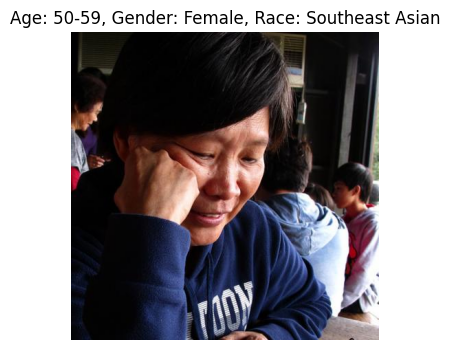

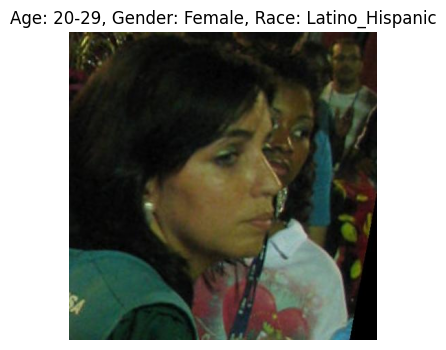

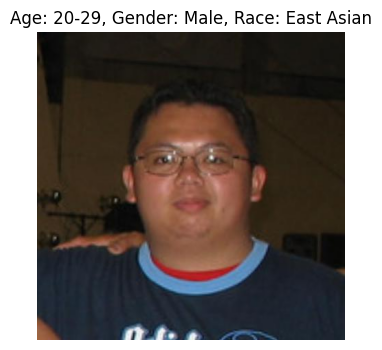

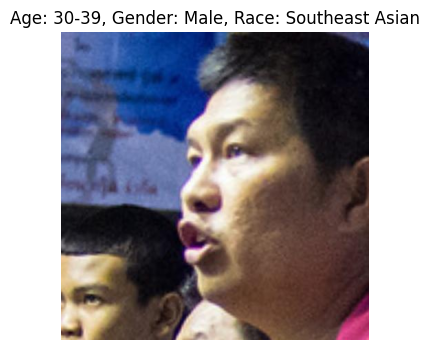

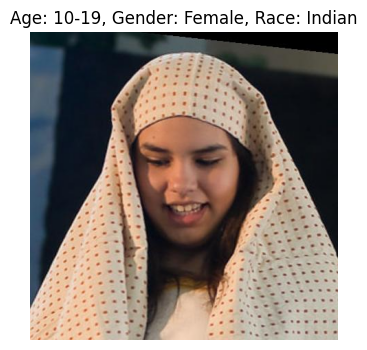

...

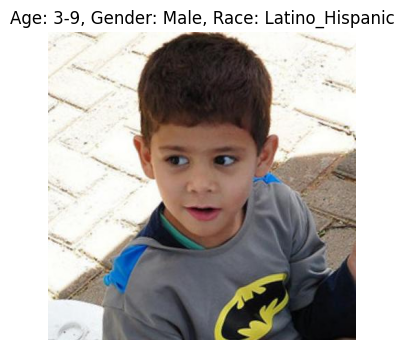

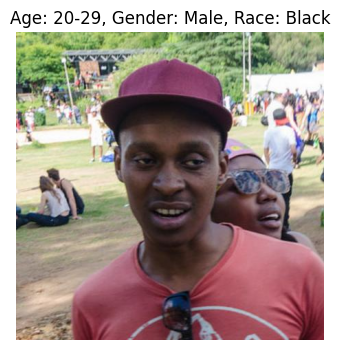

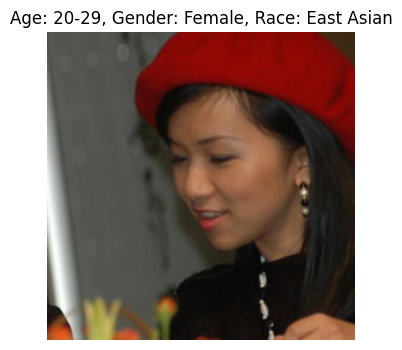

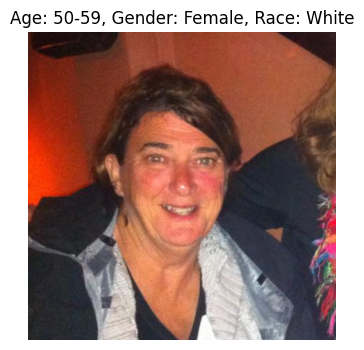

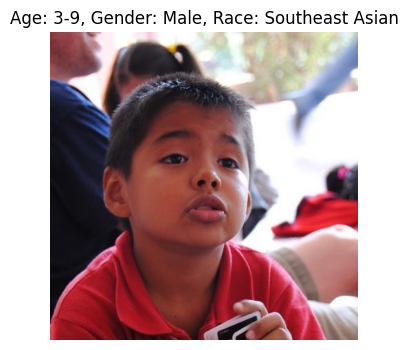

In [ ]:
from datasets import load_dataset
import pandas as pd
from PIL import Image, UnidentifiedImageError
from io import BytesIO
import matplotlib.pyplot as plt

dataset = load_dataset("HuggingFaceM4/FairFace", "1.25", split="train").select(range(15000)) #carico un sottoinsieme del dataset selezionando 15.000 immagini dello split "train"

df = dataset.to_pandas()

df = df[df['service_test'] == True].reset_index(drop=True) #uso il filtro "service_test" per selezionare solo immagini validate e sicure

race_labels = { #trasformo le etichette numeriche di "race", "gender", "age" in etichette testuali per facilitarne l'interpretabilità
    0: 'East Asian',
    1: 'Indian',
    2: 'Black',
    3: 'White',
    4: 'Middle Eastern',
    5: 'Latino_Hispanic',
    6: 'Southeast Asian'
}
gender_labels = {0: 'Male', 1: 'Female'}

age_labels = {
    0: "0-2", 1: "3-9", 2: "10-19", 3: "20-29", 4: "30-39",
    5: "40-49", 6: "50-59", 7: "60-69", 8: "more than 70"
}

df['race'] = df['race'].map(race_labels)
df['gender'] = df['gender'].map(gender_labels)
df['age'] = df['age'].map(age_labels)

min_samples = 10

samples = ( #tramite sampling creo un campione omogeneo e rappresentativo dove ogni combinazione di razza e genere è presente con almeno 10 esempi, se possibile
    df.groupby(['race', 'gender'])
      .apply(lambda group: group.sample(n=min_samples, random_state=42) if len(group) >= min_samples else group)
      .reset_index(drop=True)
)

balanced_df_subset = samples.copy()

def safe_open(image_bytes): #intercetto errori comuni che possono interessare le immagini, in quanto il dataset potrebbe contenere byte raw e/o immagini corrotte
    try:
        return Image.open(BytesIO(image_bytes)).convert("RGB")
    except (UnidentifiedImageError, OSError, KeyError) as e:
        print(f"[Errore immagine]: {e}")
        return None

balanced_df_subset['image'] = balanced_df_subset['image'].apply(
    lambda x: safe_open(x['bytes']) if isinstance(x, dict) else x
)
balanced_df_subset = balanced_df_subset[balanced_df_subset['image'].notnull()].reset_index(drop=True)

random_samples = balanced_df_subset.sample(n=20, random_state=42).reset_index(drop=True) #prendo 20 immagini casuali ma riproducibili e ne creo un campione

for i in range(20):
    row = random_samples.iloc[i] #effettuo la visualizzazione del campione casuale tramite matplotlib mostrando i metadati come titolo della figura
    image = row['image']
    age = row['age']
    gender = row['gender']
    race = row['race']

    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Age: {age}, Gender: {gender}, Race: {race}")
    plt.show()

**GENERAZIONE DELLE CAPTION CON BLIP**

Ho implementato la pipeline per la generazione automatica di caption sulle immagini del dataset bilanciato, utilizzando il modello **BLIP**. Le caption generate vengono poi inserite nel DataFrame originale, mantenendo la corrispondenza tra immagini e descrizioni.

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:943: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

  0%|          | 0/35 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/transformers/generation/utils.py:1369: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(
100%|██████████| 35/35 [09:56<00:00, 17.04s/it]


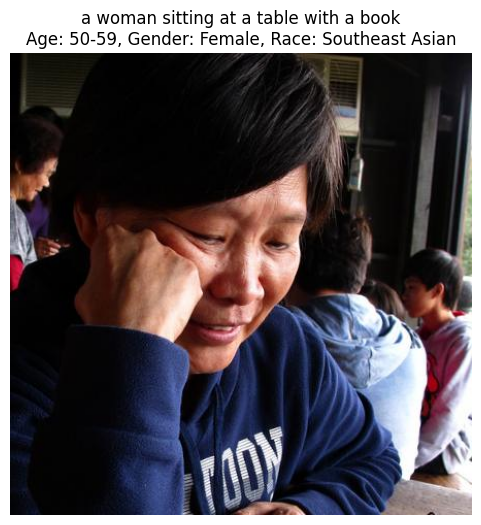

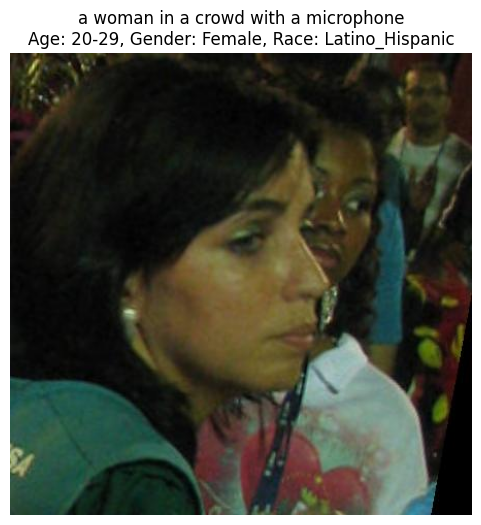

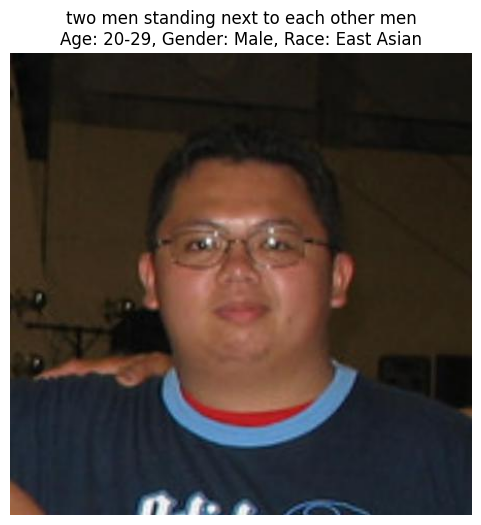

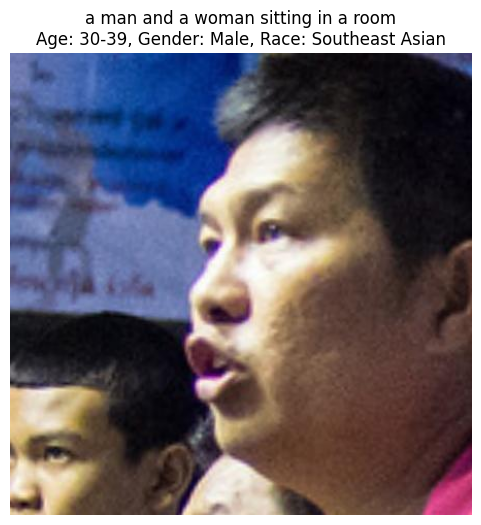

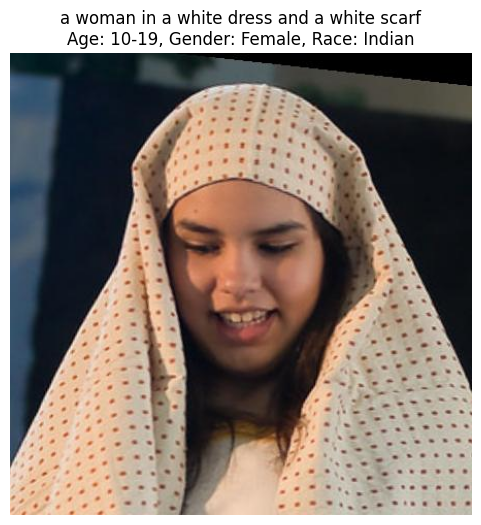

...

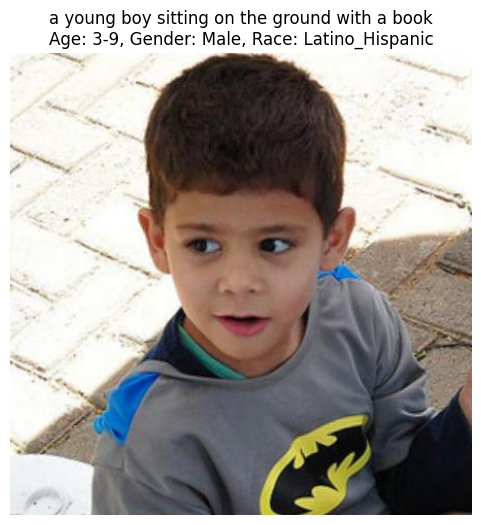

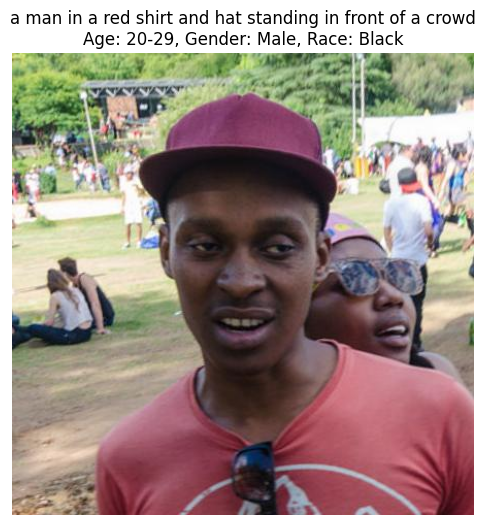

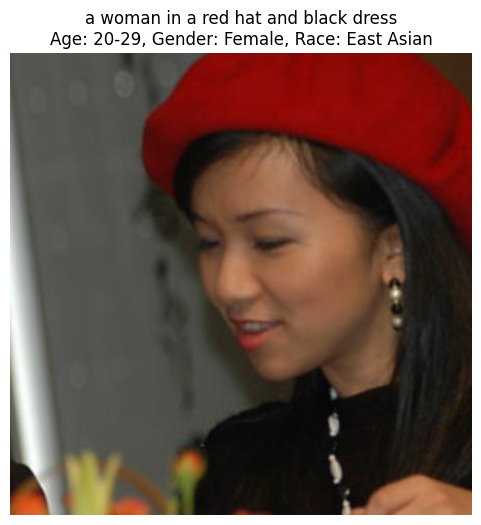

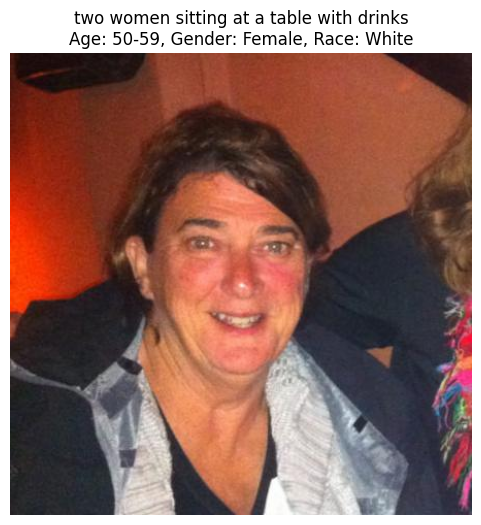

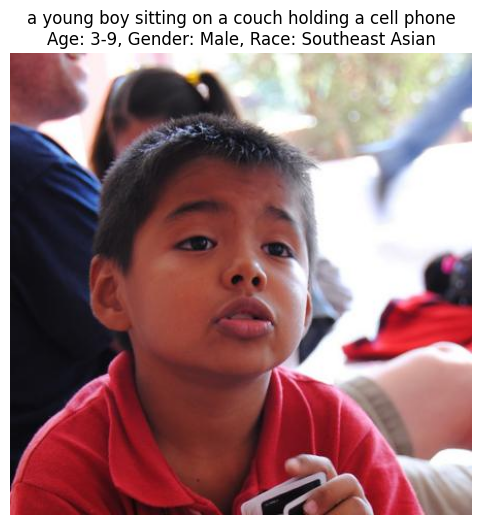

In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from PIL import UnidentifiedImageError
import torch
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base") #carico il "BlipProcessor", responsabile della pre-elaborazione delle immagini
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device) #carico il "BlipForConditionalGeneration", ovvero il modello generativo basato su Transformer per produrre le didascalie
model.eval() #la modalità eval mi permette di disattivare dropout e batch norm, ottimizzando l'uso della memoria

batch_size = 4

valid_images = []
valid_indices = []

for idx, img in enumerate(balanced_df_subset['image']): #includo un ciclo for di pulizia preventiva delle immagini non valide, mantenendo solo le immagini e gli indici validi
    try:
        valid_images.append(img)
        valid_indices.append(idx)
    except (UnidentifiedImageError, OSError) as e:
        print(f"[Errore immagine indice {idx}]: {e}")

captions = []
for i in tqdm(range(0, len(valid_images), batch_size)):
    batch_imgs = valid_images[i:i+batch_size]

    try:
        inputs = processor(images=batch_imgs, return_tensors="pt", padding=True).to(device) #ogni batch viene pre-processato dal "processor" che restituisce tensori pronti per il modello
        with torch.no_grad(): #con "torch.no_grad" evito il tracciamento del grafo computazionale,riducendo l'uso della memoria
            outputs = model.generate(**inputs) #il modello genera per ciascuna immagine una caption tramite "model.generate"
        batch_captions = processor.batch_decode(outputs, skip_special_tokens=True) #le sequenze vengono decodificate senza token speciali e raccolte in una lista
    except Exception as e: #se si verifica qualche errore nella generazione, assegno una caption placeholder ("Errore nella caption") così da non interrompere il processo
        print(f"[Errore batch {i}-{i+batch_size}]: {e}")
        batch_captions = ["Errore nella caption"] * len(batch_imgs)

    captions.extend(batch_captions)

balanced_df_subset.loc[valid_indices, 'caption'] = captions #le caption generale vengono inserite nel df mantenendo la corrispondenza con le immagini tramite indici validi

balanced_df_subset = balanced_df_subset[balanced_df_subset['caption'].notnull()].reset_index(drop=True)

random_samples = balanced_df_subset.sample(n=20, random_state=42).reset_index(drop=True)

for i in range(len(random_samples)):
    row = random_samples.iloc[i]
    image = row['image']
    caption = row['caption']
    age = row['age']
    gender = row['gender']
    race = row['race']

    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"{caption}\nAge: {age}, Gender: {gender}, Race: {race}")
    plt.show()

**VISUALIZZAZIONE CAPTION CON DISPLACY**

Implemento un'analisi linguistica di tipo sintattico sulle caption generate da BLIP, sfruttando la libreria SpaCy. Verifico come i modelli di captioning strutturano le frasi dal punto di vista grammaticale ed esploro le relazioni sintattiche tra le parole, per supportare in seguito un'analisi orientatat al soggetto e al verbo principale.

In [ ]:
import spacy
from spacy import displacy

nlp = spacy.load("en_core_web_sm") #carico il modello "en_core_web_sm", pre-addestrato su testi inglesi

for i in range(len(random_samples)):
    caption = random_samples.iloc[i]['caption']
    doc = nlp(caption) #per ciascuna caption del campione applico il parsing con "nlp(caption)"
    print(f"\nCaption {i+1}: {caption}")
    displacy.render(doc, style="dep", jupyter=True, options={"compact": True, "color": "purple"}) #uso "displacy.render" per mostrare nel notebook la struttura ad albero delle dipendenze grammaticali


Caption 1: a woman sitting at a table with a book



Caption 2: a woman in a crowd with a microphone



Caption 3: two men standing next to each other men



Caption 4: a man and a woman sitting in a room



Caption 5: a woman in a white dress and a white scarf



Caption 6: a young boy standing on the beach



Caption 7: a woman in a purple scarf



Caption 8: a girl with a green leaf on her head



Caption 9: a woman in a black shirt and red scarf



Caption 10: a black and white photo of three women



Caption 11: a man in a hat drinking a beer



Caption 12: a man sitting in a red chair with a white shirt



Caption 13: a woman in a white hat and black jacket



Caption 14: a woman and a child pose for a photo



Caption 15: a man and woman sitting next to each other people



Caption 16: a young boy sitting on the ground with a book



Caption 17: a man in a red shirt and hat standing in front of a crowd



Caption 18: a woman in a red hat and black dress



Caption 19: two women sitting at a table with drinks



Caption 20: a young boy sitting on a couch holding a cell phone


**ESTRAZIONE DI ENTITA' E KEYWORDS CON SPACY E YAKE**

Estraggo le informazioni linguistiche a partire dalle didascalie generate da BLIP, in modo tale da isolare i sostantivi per analizzare i riferimento oggettuali delle caption e dall'altro per identificare le parole chiave più significative. questi due livelli di analisi permettono di confrontare ciò che il modello vede con ciò che descrive verbalmente.

In [ ]:
import spacy
import yake
import pandas as pd

nlp = spacy.load("en_core_web_sm") #uso spacy per il Part_Of_Speech tagging (POS)

kw_extractor = yake.KeywordExtractor(top=5) #uso YAKE per individuare le parole e le frasi chiave più rilevanti

def extract_nouns_keywords(text): #questa funzione riceve in input la caption, la passa al parser Spacy e da essa estrae due liste
    doc = nlp(text)
    nouns = [token.text for token in doc if token.pos_ == "NOUN"] #una lista di sostantivi puri
    keywords = [kw for kw, score in kw_extractor.extract_keywords(text)] #una lista di keywords che possono contenere anche n-grammi
    return nouns, keywords

balanced_df_subset[['nouns', 'keywords']] = balanced_df_subset['caption'].apply( #vengono aggiunte tramite la funzione "apply" di Pandas due nuove colonne "nouns" e "keywords"
    lambda text: pd.Series(extract_nouns_keywords(text))
)

balanced_df_subset[['caption', 'nouns', 'keywords']].head(10)

,caption,nouns,keywords
0,a man and woman standing next to each other pe...,"[man, woman, people]","[man and woman, woman standing, people, man, w..."
1,a young boy sitting at a table with a plate of...,"[boy, table, plate, food]","[young boy sitting, plate of food, young boy, ..."
2,a woman in a silver costume and headpiece,"[woman, silver, costume, headpiece]","[costume and headpiece, silver costume, headpi..."
3,a woman with curly hair and a blue shirt,"[woman, hair, shirt]","[blue shirt, woman with curly, curly hair, shi..."
4,a woman in a white shirt is writing on a piece...,"[woman, shirt, piece, paper]","[piece of paper, white shirt, shirt is writing..."
5,a young girl in a brown sweater and white shirt,"[girl, sweater, shirt]","[white shirt, young girl, brown sweater, sweat..."
6,a woman in a crowd of people,"[woman, crowd, people]","[crowd of people, people, woman, crowd]"
7,two women smiling and posing for the camera,"[women, camera]","[women smiling, smiling and posing, camera, wo..."
8,a group of young girls in a school,"[group, girls, school]","[group of young, young girls, school, group, y..."
9,a young girl sitting on a bench in a building,"[girl, bench, building]","[young girl sitting, young girl, girl sitting,..."


**TOP KEYWORDS**


Genero dei grafici a barre orizzontali che mostrano le top_n keywords più frequenti per ciascuna categoria di una colonna demografica all'interno del *balanced_df_subset*. Analizzo in questo modo le tendenze linguistiche o le associazioni più comuni nei sottogruppi, ad esempio per valutare bias o differenze semantiche.

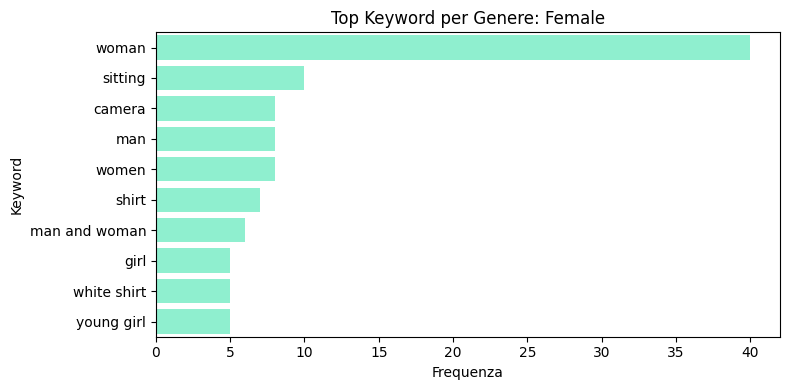

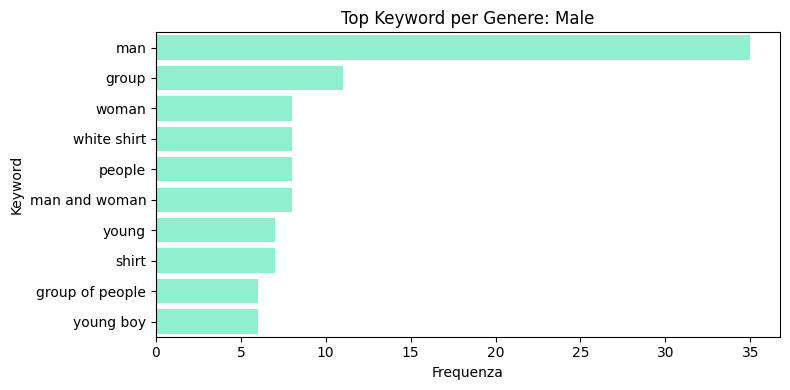

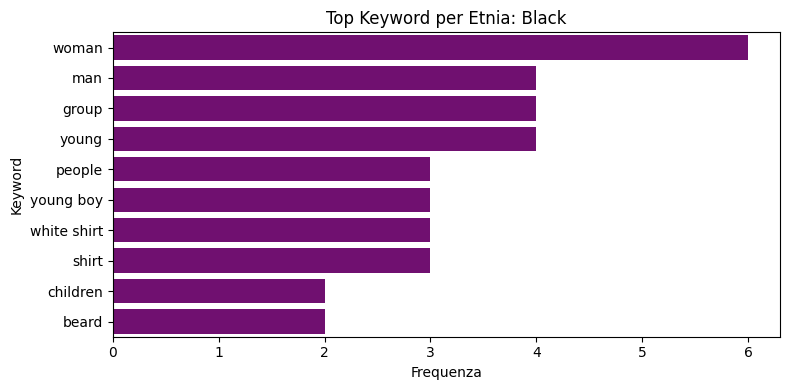

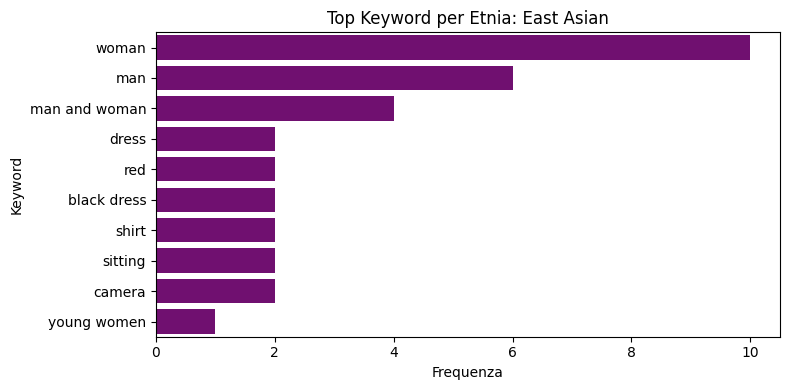

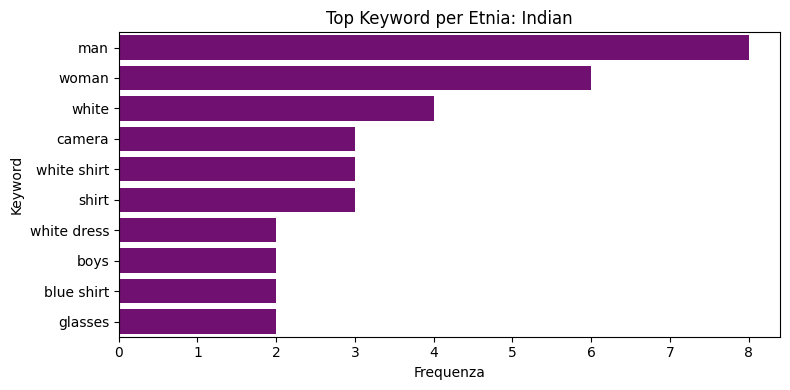

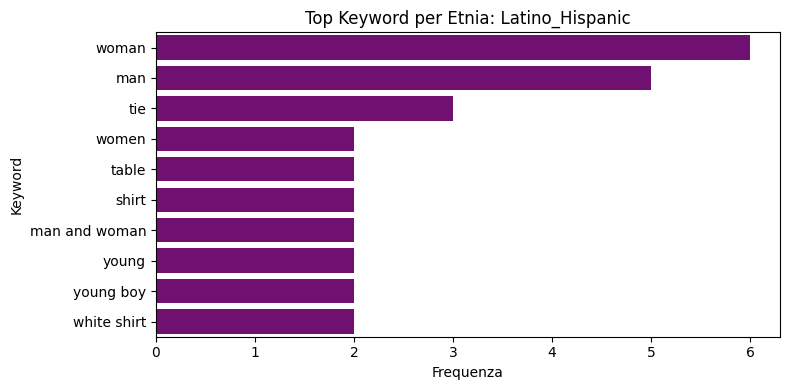

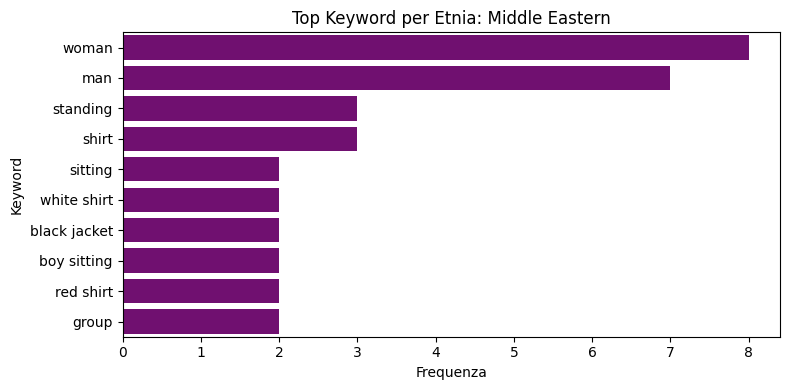

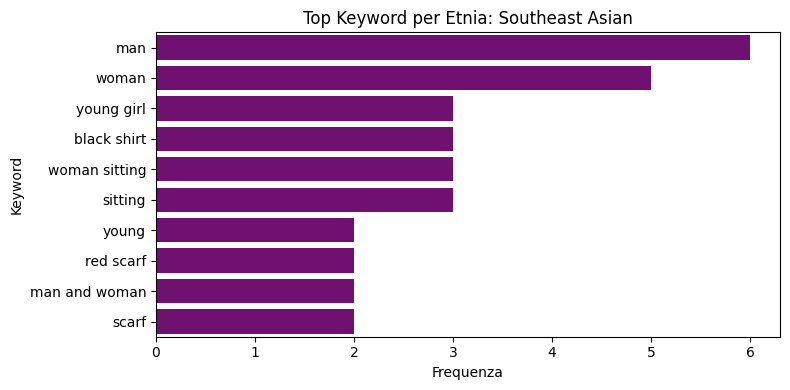

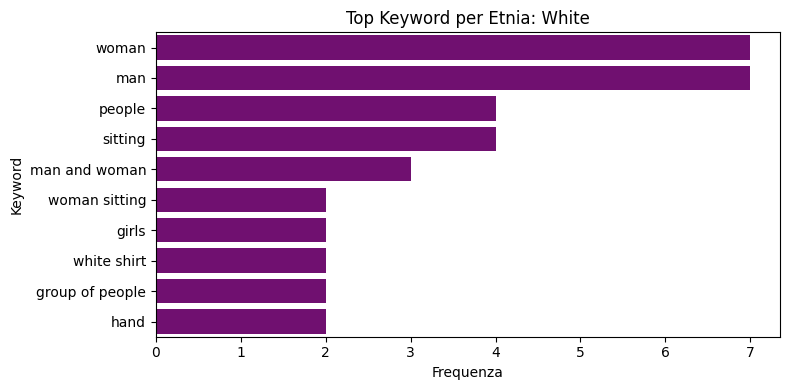

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def plot_top_keywords(df, column_name, title_prefix, color='', top_n=10): #la funzione prende in input il df, il nome della colonna da usare per segmentare i dati, il titolo del grafico, il colore da usare per le barre e il numero di keyword (10) più frequenti da visualizzare
    for val in sorted(df[column_name].unique()): #itero su titti i valori distinti presenti nella colonna demografica specificata
        subset = df[df[column_name] == val] #filtro il dataset per mantenere solo le righe appartenenti a quella categoria specifica
        all_keywords = [kw for sublist in subset['keywords'] for kw in sublist] #questa list comprehension appiattisce tutte le liste in un'unica lista piatta
        keyword_freq = pd.Series(all_keywords).value_counts().nlargest(top_n) #creo una Series di Pandas partendo dalla lista "all_keywords" della quale si calcola la frequenza di ogni keyword e poi si estraggono le 10 più frequenti
        plt.figure(figsize=(8, 4))
        sns.barplot(x=keyword_freq.values, y=keyword_freq.index, color=color) #creo un grafico a barre orizzontali dove le x sono le frequenze e le y sono i nomi delle keywords
        plt.title(f"{title_prefix}: {val}", fontsize=12)
        plt.xlabel("Frequenza")
        plt.ylabel("Keyword")
        plt.tight_layout()
        plt.show()

plot_top_keywords(balanced_df_subset, 'gender', 'Top Keyword per Genere', 'aquamarine')
plot_top_keywords(balanced_df_subset, 'race', 'Top Keyword per Etnia', 'purple')

**WORDCLOUD DELLE KEYWORDS**

Sviluppo una funzione di visualizzazione che sfrutta le WordCloud per rappresentare graficamente le keywords più frequenti associate a diversi gruppi demografici. L'obiettivo principale è evidenziare differenze lessicali nelle caption generate dal modello BLIP.

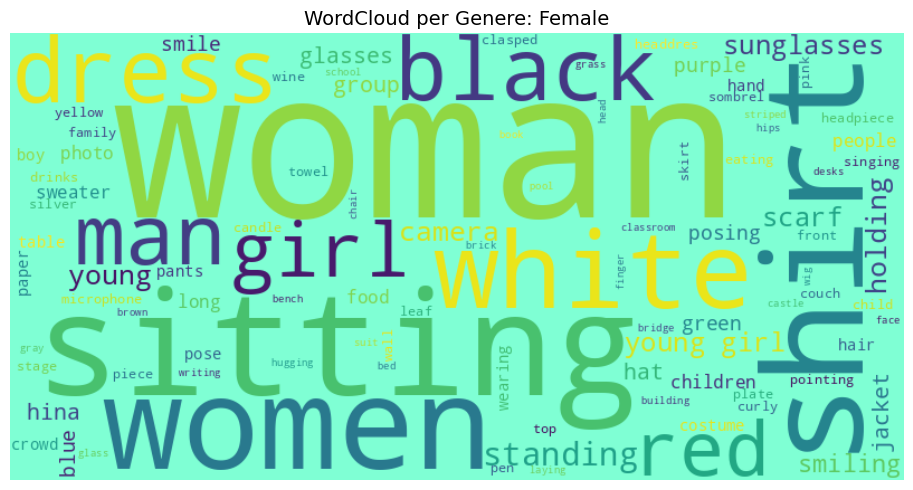

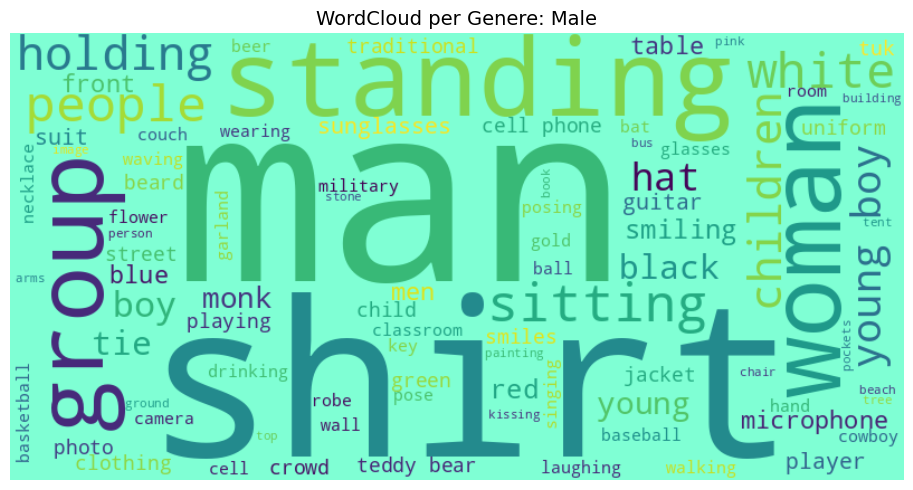

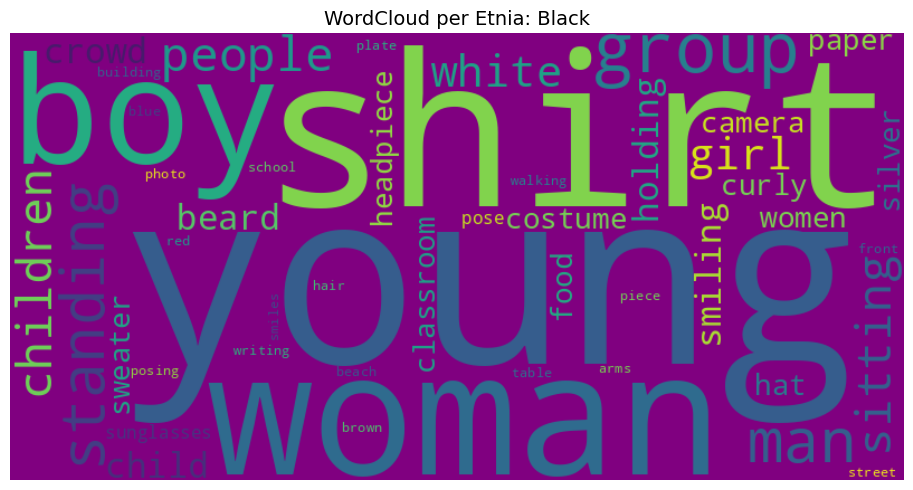

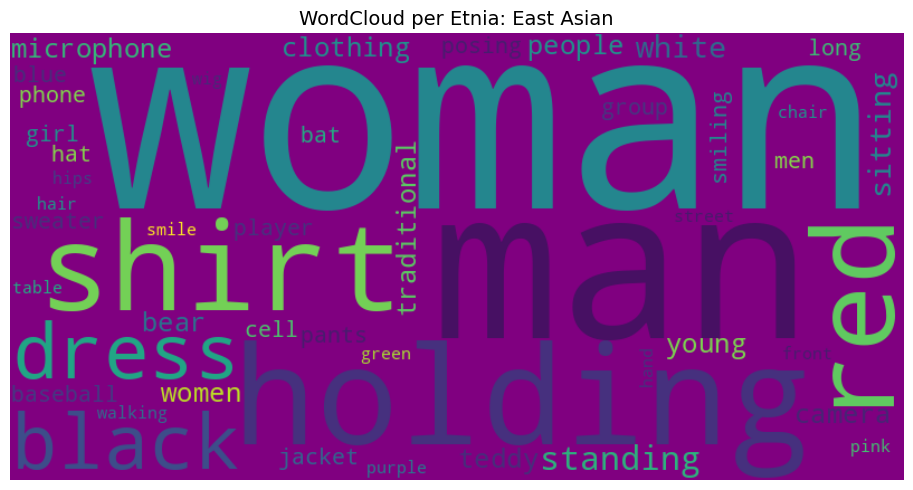

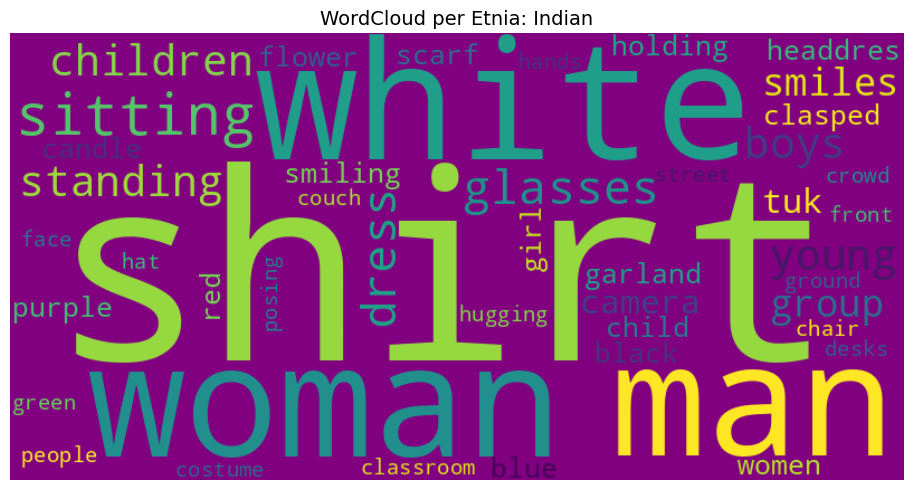

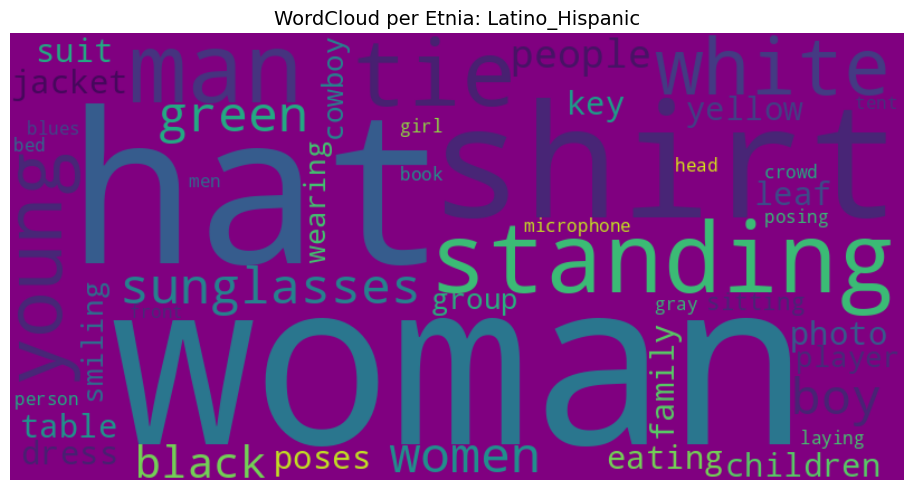

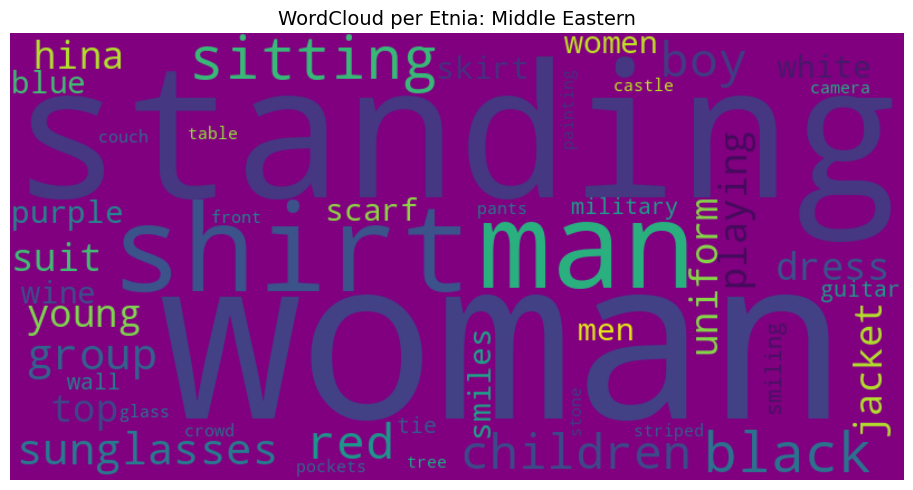

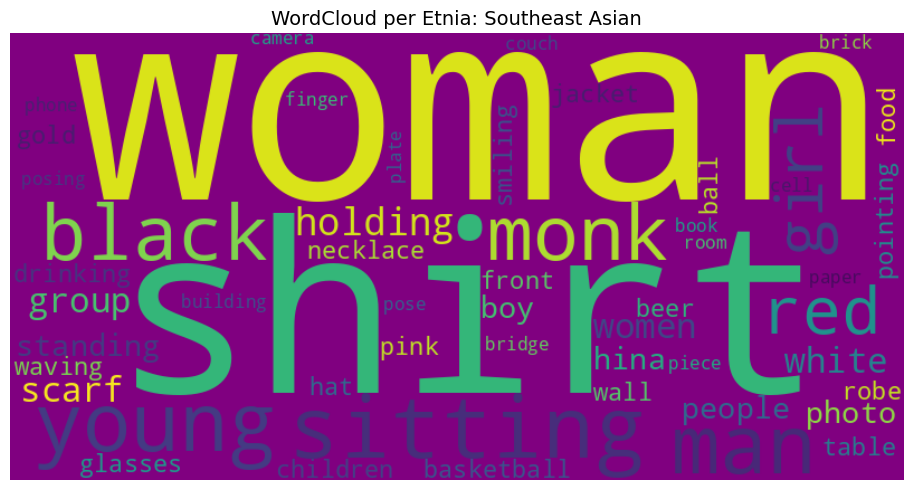

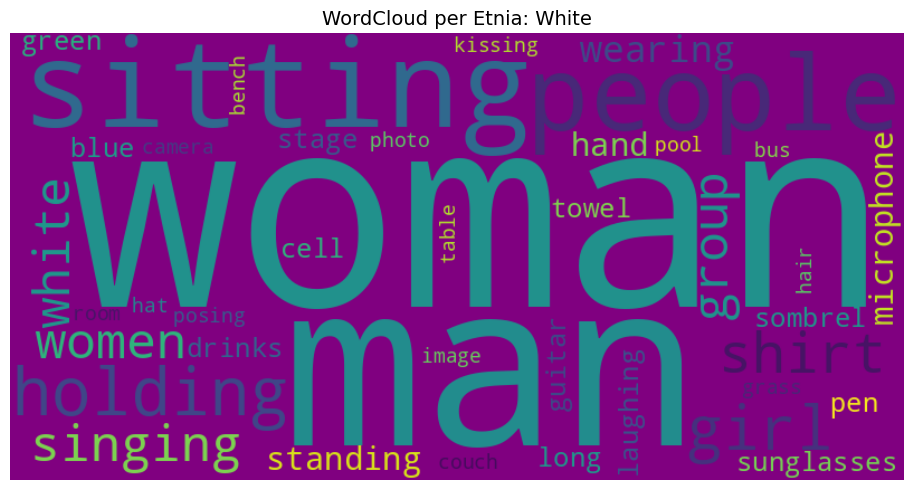

In [ ]:
from wordcloud import WordCloud
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def plot_wordcloud_demographic(df, demographic_col, keywords_col='keywords', title_prefix='', background_color=''): #la funzione riceve in input: un df, il nome della colonna su cui segmentare i dati, il nome della colonna contenente le keywords, il titolo, un colore di sfondo per la visualizzazione
    for val in sorted(df[demographic_col].unique()): #itero sui valori unici della colonna demografica
        subset = df[df[demographic_col] == val] #per ogni subset concateno tutte le keywords in un'unica stringa, appiattendo le liste di parole chiave con un doppio ciclo di list comprehension
        all_keywords = [kw for sublist in subset[keywords_col] for kw in sublist]
        text = ' '.join(all_keywords)

        wordcloud = WordCloud(width=800, height=400, background_color=background_color).generate(text) #utilizzo la classe WordCloud per generare la visualizzazione che poi viene mostrata con matplotllib

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"{title_prefix}: {val}", fontsize=14)
        plt.tight_layout()
        plt.show()

plot_wordcloud_demographic(balanced_df_subset, 'gender', 'keywords', 'WordCloud per Genere', 'aquamarine')
plot_wordcloud_demographic(balanced_df_subset, 'race', 'keywords', 'WordCloud per Etnia', 'purple')

**ANALISI E VISUALIZZAZIONE DELLA FREQUENZA DEGLI AGGETTIVI PER GRUPPI DEMOGRAFICI**

Estraggo e analizzo gli aggettivi presenti nelle caption generate per le immagini, per studiare la loro distribuzione rispetto a due variabili demografiche: etnia e genere. L'analisi degli aggettivi è particolarmente importante poichè si tratta di termini che spesso veicolano giudizi, descrizioni soggettive e possono riflettere stereotipi implici.

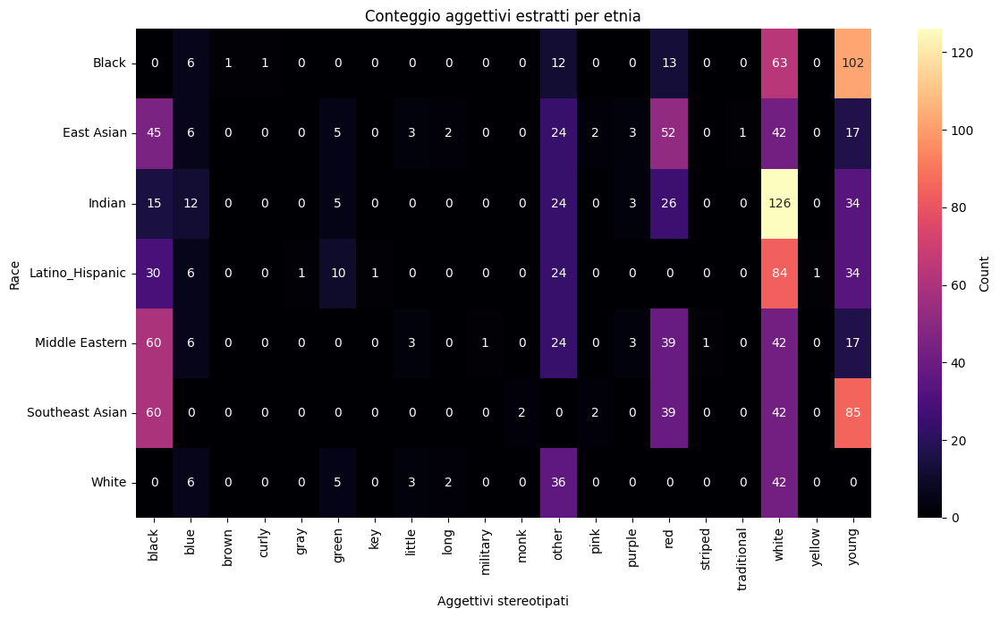

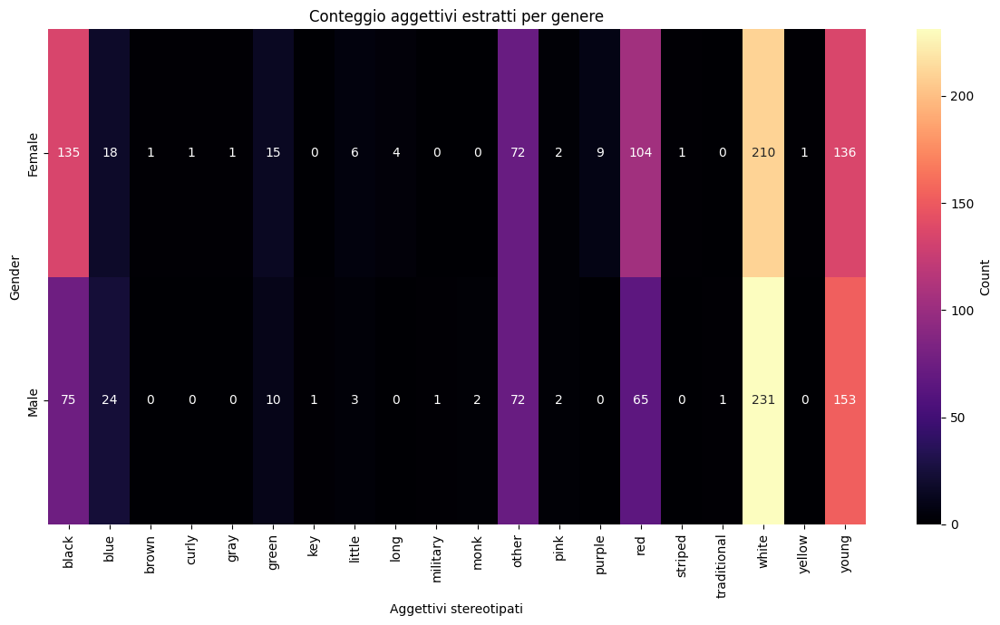

In [ ]:
from collections import defaultdict, Counter
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

adjectives = [] #creo una lista dove raccolgo tutti gli aggettivi estratti da ciascuna caption tramite POS
for caption in balanced_df_subset['caption']:
    doc = nlp(caption)
    adjectives.extend([token.text for token in doc if token.pos_ == 'ADJ'])

adj_freq = Counter(adjectives) #uso "Counter" per contare la frequenza complessiva di ogni aggettivo nel df

def plot_heatmap_for_demographic(df, demographic_col, adjectives, title): #la funzione riceve in input: un df, il nome della colonna su cui segmentare i dati, gli aggettivi, il titolo

    assoc_counts = defaultdict(lambda: defaultdict(int)) #creo una struttura dati "assoc_counts" basata su un dizionario annidato "defaultdict" che mappa ciascun gruppo demografico a un dizionario di aggettivi e conteggi associati

    for _, row in df.iterrows(): #per ogni riga del df verifico se ogni aggettivo della lista è presente nella didascalia; se un aggettivo è presente, incremento il relativo contatore per il gruppo demografico corrispondente
        caption_lower = row['caption'].lower()
        for term in adjectives:
            if term in caption_lower:
                assoc_counts[row[demographic_col]][term] += 1

    rows = []
    for group, adj_dict in assoc_counts.items(): #converto il dizionario annidato in una lista di dizionari, dove ogni riga contiene il gruppo demografico, l'aggettivo e il numero di volte che quell'aggettivo è stato usato per quel gruppo
        for adj, count in adj_dict.items():
            rows.append({demographic_col: group, 'adjective': adj, 'count': count})

    df_assoc = pd.DataFrame(rows)
    pivot_df = df_assoc.pivot_table(index=demographic_col, columns='adjective', values='count', fill_value=0) #costruisco un df che ha i gruppi demografici sulle righe, gli aggettivi sulle colonne e i vari conteggi come valori

    plt.figure(figsize=(12, 7))
    sns.heatmap(pivot_df, annot=True, fmt='.0f', cmap='magma', cbar_kws={'label': 'Count'}) #uso "seaborn.heatmap" per rappresentare graficamente questa matrice
    plt.title(title)
    plt.ylabel(demographic_col.capitalize())
    plt.xlabel("Aggettivi stereotipati")
    plt.tight_layout()
    plt.show()

plot_heatmap_for_demographic(balanced_df_subset, 'race', adjectives, "Conteggio aggettivi estratti per etnia")
plot_heatmap_for_demographic(balanced_df_subset, 'gender', adjectives, "Conteggio aggettivi estratti per genere")

**ESTRAZIONE E VISUALIZZAZIONE VERBI PER GRUPPO DEMOGRAFICO**

Implemento un'analisi centrata sull'estrazione dei verbi dalle caption delle immagini, con l'obiettivo di esplorare quali azioni vengono associate più freqeuntemente ai diversi gruppi demografici, definiti dalla combinazione di genere ed etnia. L'analisi dei verbi può rivelare non soltanto bias lessicali, ma anche implicazioni narrative o comportamentali che il modello di captioning potrebbe introdurre o riflettere.

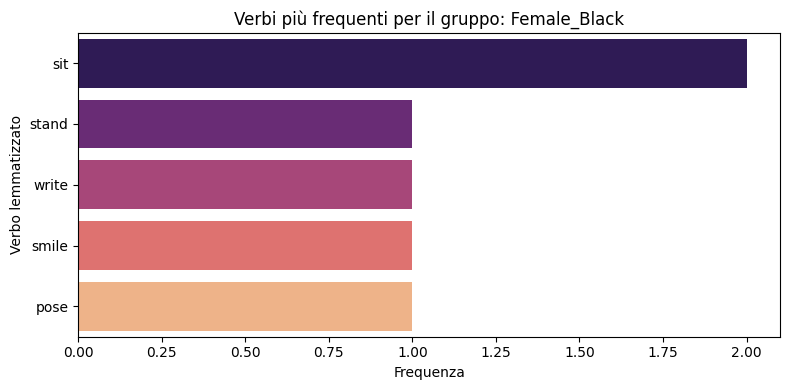

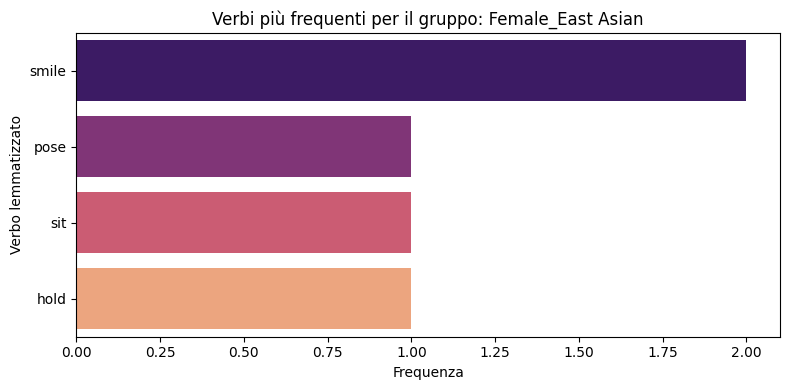

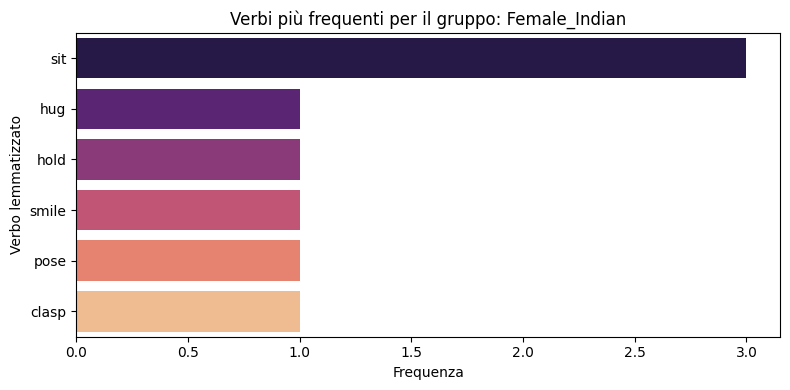

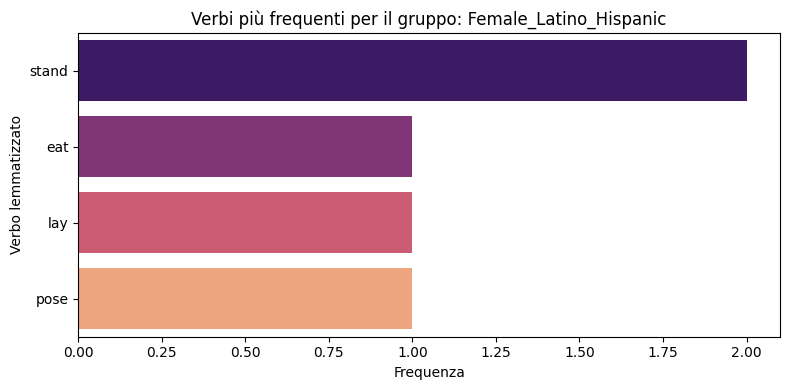

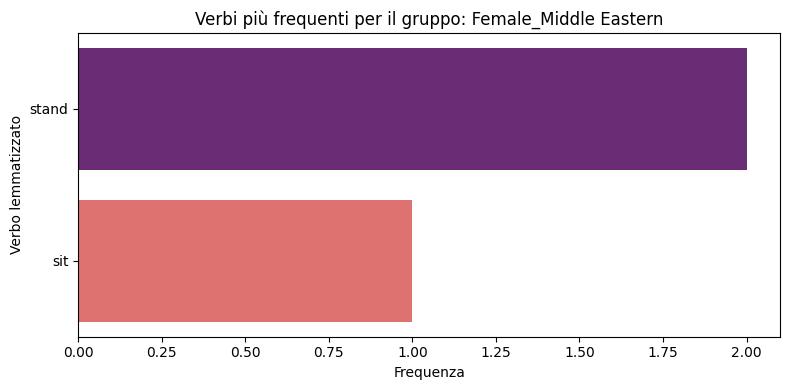

...

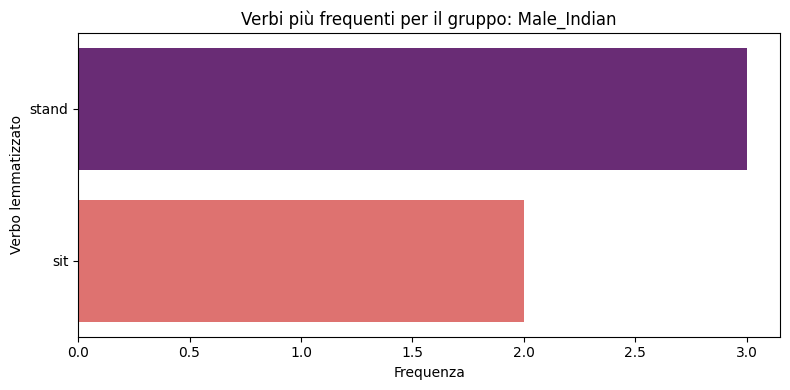

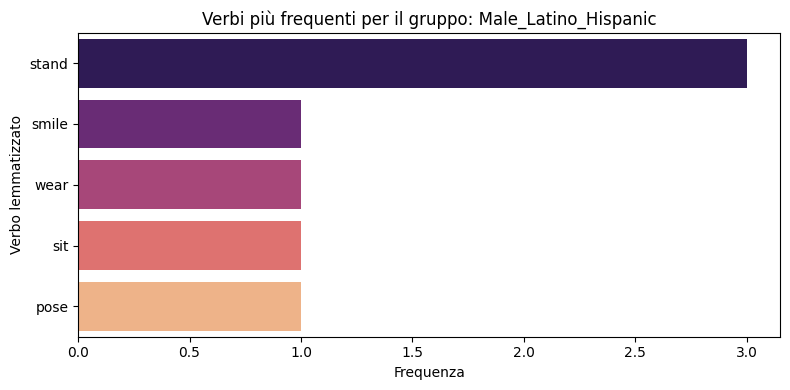

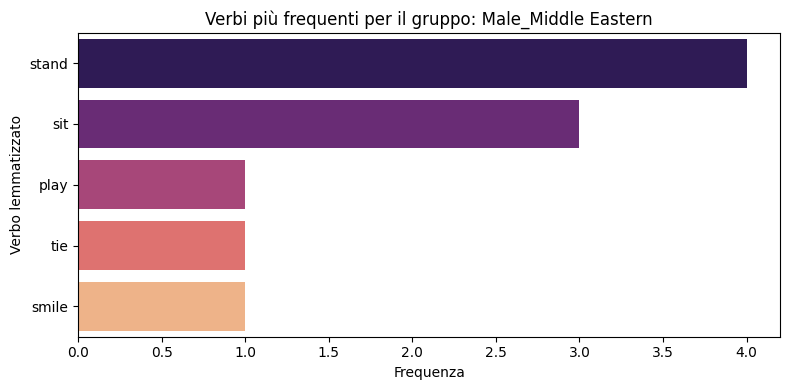

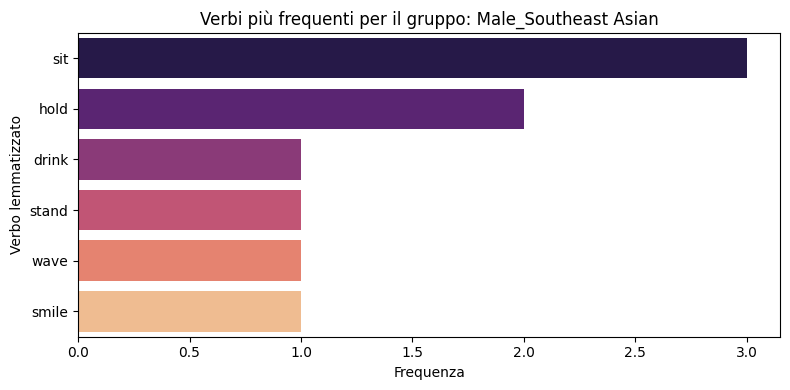

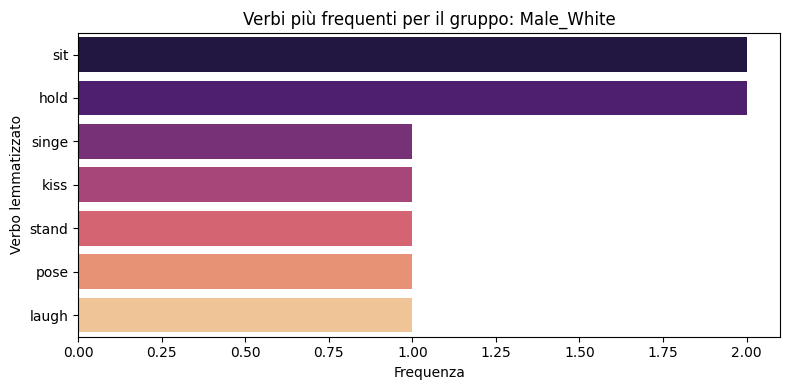

In [ ]:
from collections import defaultdict, Counter
import re
import warnings

def extract_verbs(text): #definisco la funzione che converte il testo in minuscolo e, tramite POS, filtra soltanto i verbi
    doc = nlp(text.lower())
    return [token.lemma_ for token in doc if token.pos_ == "VERB"]

balanced_df_subset['verbs'] = balanced_df_subset['caption'].apply(extract_verbs)

if 'group' not in balanced_df_subset.columns: #creo una nuova colonna "group" per il df che concatena genere e razza
    balanced_df_subset['group'] = balanced_df_subset.apply(lambda r: f"{r['gender']}_{r['race']}", axis=1)

group_verbs = defaultdict(list) #utilizzo un dizionario "defaultdict" per aggregare tutte le liste di verbi per ciascun gruppo, iterando sulle righe del df
for _, row in balanced_df_subset.iterrows():
    group_verbs[row['group']].extend(row['verbs'])

rows = [{'group': group, 'verb': verb, 'count': count} #per ogni gruppo conto le occorrenze di ciascun verbo con Counter e seleziono i 10 verbi più frequenti
        for group, verbs in group_verbs.items()
        for verb, count in Counter(verbs).most_common(10)]

df_verbs = pd.DataFrame(rows) #la lista di dizionari dei verbi viene convertita in df per facilitare la manipolazione la visualizzazione

warnings.filterwarnings("ignore", category=FutureWarning) #sopprimo avviso di tipo "FutureWarning" perchè appesantivano l'output

for group, subset in df_verbs.groupby('group'): #per ogni "group" genero un grafico a barre orizzontali con "seaborn.barplot", dove l'asse y mostra i verbi lemmatizzati e l'asse x la frequenza assoluta dei verbi nel gruppo
    plt.figure(figsize=(8, 4))
    sns.barplot(x='count', y='verb', data=subset, palette='magma')
    plt.title(f"Verbi più frequenti per il gruppo: {group}", fontsize=12)
    plt.xlabel("Frequenza")
    plt.ylabel("Verbo lemmatizzato")
    plt.tight_layout()
    plt.show()

**ANALISI E VISUALIZZAZIONE DELLE CO-OCCORRENZE SOGGETTO + VERBO**

Estraggo e analizzo le coppie soggetto-verbo presenti nelle didascalie generate dal modello di captioning. Questo tipo di analisi è particolarmente rilevante per indagare le relazioni sintattiche e semantiche implicite nelle caption, fornendo un'indicazione sui modi in cui soggetti e azioni sono rappresentati.

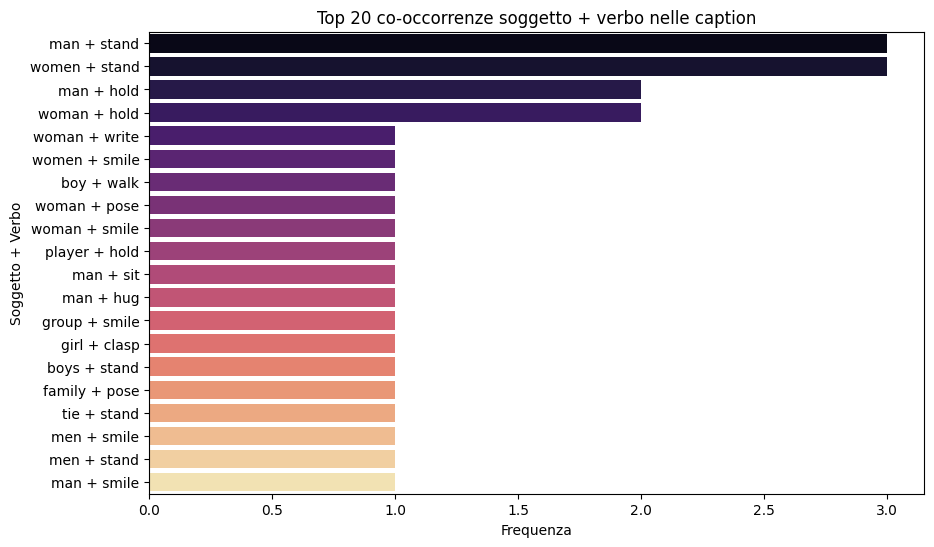

In [ ]:
from collections import Counter
import spacy
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

nlp = spacy.load("en_core_web_sm")

def extract_subject_verb_pairs(text):
    doc = nlp(text.lower())
    pairs = []
    for token in doc:
        if token.pos_ == "VERB": #per ogni verbo estratto tramite POS, la funzione identifica i figli sintattici che svolgono la funzione di soggetto attivo o passivo e che sono nominali
            subjects = [child.text for child in token.children if child.dep_ in ("nsubj", "nsubjpass") and child.pos_ == "NOUN"]
            for subj in subjects:
                pairs.append(f"{subj} + {token.lemma_}") #per ogni soggetto individuato viene creato un pattern testuale che viene aggiunto a una lista
    return pairs

balanced_df_subset['subj_verb_pairs'] = balanced_df_subset['caption'].apply(extract_subject_verb_pairs) #applico questa funzione a ogni caption nella colonna caption del df, creando una nuova colonna contenetente le coppie soggetto-verbo

all_pairs = [pair for pairs in balanced_df_subset['subj_verb_pairs'] for pair in pairs] #creo una lista di tutte le coppie per poi contarne le occorrenze con Counter

pair_counts = Counter(all_pairs)

top_n = 20
df_pairs = pd.DataFrame(pair_counts.most_common(top_n), columns=['subject + verb', 'count']) #estraggo le 20 coppie più frequenti e le inserisco all'interno di un df per facilitarne la visualizzazione

plt.figure(figsize=(10, 6))
plt.tight_layout()
sns.barplot(data=df_pairs, x='count', y='subject + verb', palette='magma')
plt.title("Top 20 co-occorrenze soggetto + verbo nelle caption")
plt.xlabel("Frequenza")
plt.ylabel("Soggetto + Verbo")
plt.show()


**IDENTIFICAZIONE DELLE PAROLE DISTINTIVE PER GRUPPO DEMOGRAFICO**

Individuo le parole più rappresentative o "distintive" all'interno delle caption associate a diverse combinazioni di genere ed etnia, inserite all'interno di una colonna chiamata group. L'obiettivo è quindi quello di evidenziare termini specifici che caratterizzano ogni gruppo demografico, per poi visualizzarli attraverso una heatmap che mostra la loro importanza relativa.

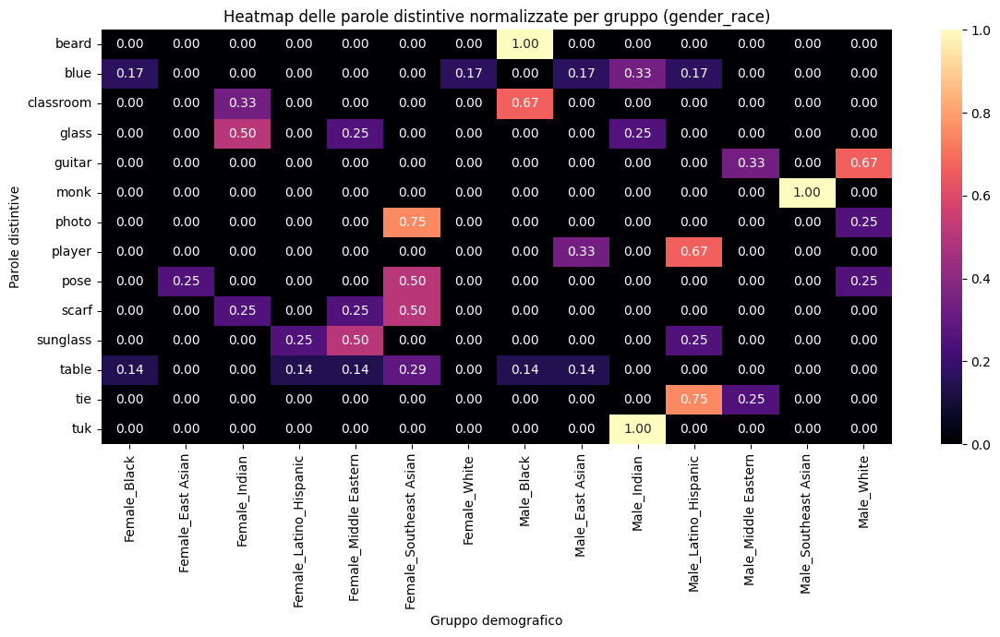

In [ ]:
import pandas as pd
from collections import Counter
import spacy

nlp = spacy.load("en_core_web_sm")
stopwords = nlp.Defaults.stop_words

def preprocess_text(text, nlp, stopwords): #la funzione converte le parole in minuscolo ed estrae solo i token alfabetici applicando inoltre la lemmatizzazione e rimuovendo le parole che appartengono alla lista di stopwords predefinite in spaCy
    doc = nlp(text.lower())
    return [token.lemma_ for token in doc if token.is_alpha and token.text not in stopwords]

def get_word_freqs(texts, nlp, stopwords): #la funzione, dopo aver applicato il preprocessing, conta quante volte compare ogni parola lemmatizzata
    all_tokens = []
    for text in texts:
        all_tokens.extend(preprocess_text(text, nlp, stopwords))
    return Counter(all_tokens)

groups = balanced_df_subset['group'].unique() #estraggo tutti i gruppi demografici distinti
freqs_per_group = {} #preparo la struttura per contenere le parole più distintive per gruppo
top_n = 20

for group in groups:
    texts = balanced_df_subset.loc[balanced_df_subset['group'] == group, 'caption'].tolist() #estraggo tutte le caption per gruppo
    freqs_per_group[group] = get_word_freqs(texts, nlp, stopwords).most_common(top_n) #ottengo "le top_n" parole

rows = [ #le frequenze vengono organizzate in una lista di dizionari
    {'group': group, 'word': word, 'count': count}
    for group, freq_list in freqs_per_group.items()
    for word, count in freq_list
]

freq_df = pd.DataFrame(rows) #la lista di dizionari vengono poi convertiti in un df
pivot_df = freq_df.pivot(index='word', columns='group', values='count').fillna(0) #viene creato un pivot table con le parole sulle righe e i gruppi sulle colonne, mentre i valori sono i conteggi
threshold = 2 #la parola deve apparire almeno 2 volte nel gruppo in esame
distinctive_words = []
for group in groups: #negli altri gruppi la frequenza massima di quella parola deve essere molto bassa, inferiore o uguale a 1
    others = [g for g in groups if g != group]
    distinctive = pivot_df[(pivot_df[group] >= threshold) & (pivot_df[others].max(axis=1) <= 1)]
    distinctive_words.extend(distinctive.index.tolist())

distinctive_words = sorted(set(distinctive_words))
heatmap_df = pivot_df.loc[distinctive_words] #la tabella pivot viene quindi filtrata per contenere solo le parole distintive
heatmap_data = heatmap_df.div(heatmap_df.sum(axis=1), axis=0)

plt.figure(figsize=(12, max(4, 0.5 * len(heatmap_data)))) #per ogni parola i valori di frequenza sono normalizzati rispetto alla somma totale su tutti i gruppi, trasformandoli in proporzioni relative
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="magma", cbar=True) #il risultato viene mostrato attraverso una heatmap realizzata con seaborn
plt.title("Heatmap delle parole distintive normalizzate per gruppo (gender_race)")
plt.xlabel("Gruppo demografico")
plt.ylabel("Parole distintive")
plt.tight_layout()
plt.show()

**CLUSTERIZZAZIONE SEMANTICA CON CLIP**

In questa cella prendo una serie di didascalie, le trasformo in embeddings, usando un modello di intelligenza artificiale chiamato **CLIP**, che poi uso per:
1. clusterizzare la caption simili tra loro in 5;
2. ridurre la dimensionalità degli embedding per poterli visualizzare su un grafico 2D;
3. visualizzare i cluster ottenuti in un grafico a dispersione, colorando le caption in base al gruppo di appartenenza;
4. stampare qualche esempio di caption per ciascun cluster per capire qualitativamente i temi di ogni cluster.

open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Encoding caption with CLIP (batch): 100%|██████████| 18/18 [00:11<00:00,  1.60it/s]
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


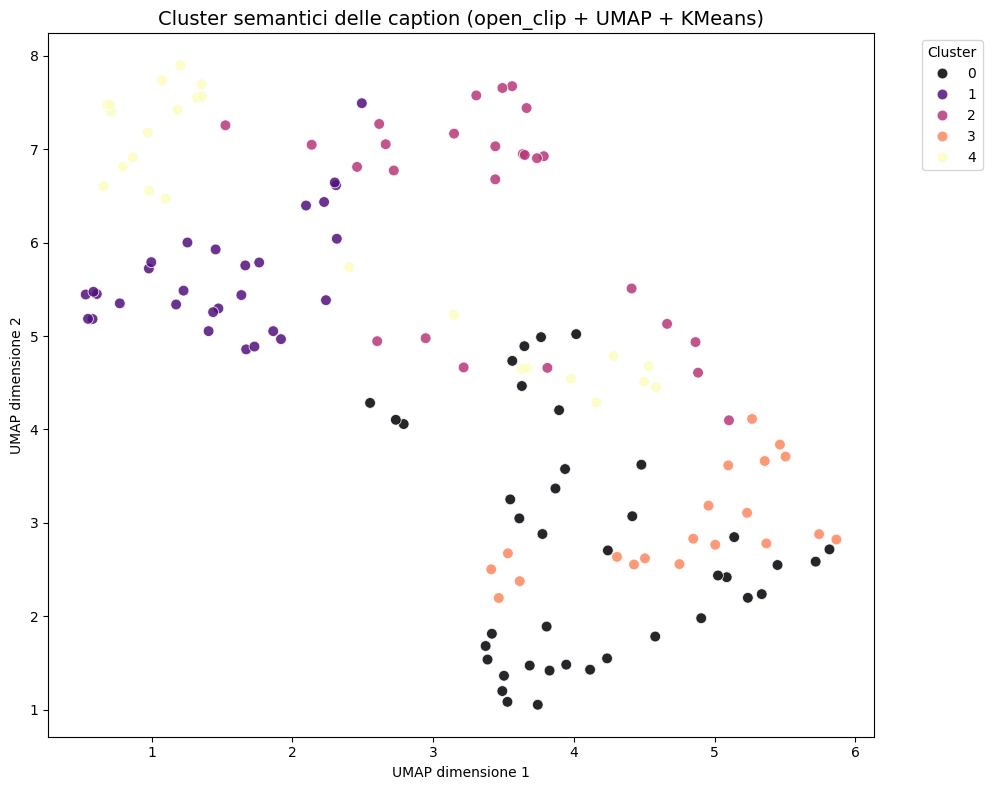

Cluster 0 (CLIP):
- a man in a hat and sunglasses is standing in front of a tent
- a woman in a yellow dress and hat
- a man in a tuk with a flower garland
- a man in a suit and tie standing next to a painting
- a woman in a red dress and a man in a green shirt
Cluster 1 (CLIP):
- a man and woman kissing in a room
- two women in hina are standing next to each other women
- a man and woman laying on a bed
- a man and woman standing in front of a building
- a man and woman in traditional clothing standing next to each other people
Cluster 2 (CLIP):
- a girl sitting on the ground with her hands clasped
- a young girl in a pink hina holding a piece of paper
- a young boy sitting at a table with a plate of food
- two girls sitting on a couch with one pointing at the camera
- a young boy sitting on the ground with a book
Cluster 3 (CLIP):
- a woman in a silver costume and headpiece
- a woman with long hair and a white shirt
- a woman in blue pants and a white shirt
- a woman with curly hair 

In [ ]:
import numpy as np
from tqdm import tqdm
import torch
import open_clip
from sklearn.cluster import KMeans
import umap

model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='laion2b_s34b_b79k') #viene caricato il modello CLIP specifico insieme alla funzione di preprocessing e al tokenizer associato
tokenizer = open_clip.get_tokenizer('ViT-B-32')

model = model.to(device).eval()

captions = balanced_df_subset['caption'].dropna().astype(str).tolist() #si estraggono le caption scartando eventuali valori mancanti e assicurandosi che siano stringhe

batch_size = 8
caption_embeddings = []

with torch.no_grad(): #in un ciclo con barra di progresso, ogni batch viene tokenizzato, trasferito sul device e passato al modello per ottenere un vettore di embedding per ogni caption
    for i in tqdm(range(0, len(captions), batch_size), desc="Encoding caption with CLIP (batch)"):
        batch_texts = captions[i:i+batch_size]
        try:
            tokens = tokenizer(batch_texts).to(device)
            embeddings = model.encode_text(tokens)
            embeddings = embeddings.cpu().numpy()
        except Exception as e: #eventuali errori vengono gestiti creando vettori di embedding nulli, in modo da non interrompere il processo
            print(f"[Errore batch {i}-{i+batch_size} durante encoding CLIP]: {e}")
            embeddings = np.zeros((len(batch_texts), model.text_projection.shape[1]))

        caption_embeddings.append(embeddings)

try:
    caption_embeddings = np.vstack(caption_embeddings) #tutti gli embeddings vengono uniti in una singola matrice NumPy
except ValueError as e: #nel caso in cui la concatenazione fallisse, viene sollevato un errore specifico
    raise RuntimeError("Errore nella concatenazione degli embeddings: controlla i batch") from e

try:
    n_clusters = 5
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto') #uso KMeans per suddividere le caption in 5 gruppi semanticamente omogenei
    labels = kmeans.fit_predict(caption_embeddings)
except Exception as e:
    raise RuntimeError(f"Errore durante clustering KMeans: {e}")

try:
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42) #uso UMAP per trasformare gli embedding originari in coordinate 2D, mantenendo le distanze e le relazioni di vicinanza tra i punti
    embedding_2d = reducer.fit_transform(caption_embeddings)
except Exception as e:
    raise RuntimeError(f"Errore durante riduzione UMAP: {e}")

balanced_df_subset = balanced_df_subset.reset_index(drop=True) #il df originale viene aggiornato con i risultati del clustering e con le coordinate 2D ottenute da UMAP
balanced_df_subset['clip_cluster'] = labels
balanced_df_subset['clip_umap_x'] = embedding_2d[:, 0]
balanced_df_subset['clip_umap_y'] = embedding_2d[:, 1]

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='clip_umap_x', y='clip_umap_y', hue='clip_cluster',
    data=balanced_df_subset, palette='magma', s=60, alpha=0.85
)
plt.title("Cluster semantici delle caption (open_clip + UMAP + KMeans)", fontsize=14)
plt.xlabel("UMAP dimensione 1")
plt.ylabel("UMAP dimensione 2")
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

for cluster_id in sorted(balanced_df_subset['clip_cluster'].unique()): #stampo per ciascun cluster un campione casuale di 5 caption appartenenti a quel cluster
    print(f"Cluster {cluster_id} (CLIP):")
    sample = balanced_df_subset[balanced_df_subset['clip_cluster'] == cluster_id].sample(n=5, random_state=42)
    for caption in sample['caption']:
        print(f"- {caption}")

**TOP KEYWORDS PER CLUSTER CLIP**

Definisco una funzione pensata per esplorare ed interpretare i risultati del clustering testuale, estraendo e stampando le parole più frequenti in ciascun cluster, fornendo così una sorta di "profilo lessicale" per ogni cluster. La funzione stampa per ogni cluster l'elenco di queste parole chiave insieme al numero di occorrenze, permettendo così di identificare rapidamente i temi o i concetti predominanti in ciascun cluster.

In [ ]:
from collections import Counter
import pandas as pd

def print_top_words_per_cluster(df, cluster_col='semantic_cluster', text_col='caption', top_n=10):
    for cluster_id in sorted(df[cluster_col].unique()): #la funzione seleziona tutte le didascalie corrispondenti a quel cluster, le concatena in un'unica grande stringa e ne estrae le singole parole
        captions = df[df[cluster_col] == cluster_id][text_col].dropna().tolist()
        words = ' '.join(captions).lower().split() #le parole vengono convertite in minuscolo e ripulite da eventuali segni di punteggiatura; si escludono inoltre parole troppo corte
        words = [w.strip(".,!?\"'()[]{}:;") for w in words if len(w) > 2]
        top_words = Counter(words).most_common(top_n) #Counter conta la frequenza di ogni termine all'interno di quel cluster e vengono estratte le 10 parole più comuni

        print(f"Cluster {cluster_id} ({cluster_col}):") #visualizzo i risultati indicando per ogni cluster le parole chiave e la loro frequenza
        for word, freq in top_words:
            print(f" - {word}: {freq}")

print_top_words_per_cluster(balanced_df_subset, cluster_col='clip_cluster')

Cluster 0 (clip_cluster):
 - man: 31
 - and: 27
 - shirt: 22
 - red: 13
 - white: 11
 - hat: 9
 - woman: 9
 - black: 9
 - with: 8
 - standing: 7
Cluster 1 (clip_cluster):
 - and: 18
 - woman: 16
 - man: 15
 - standing: 13
 - women: 13
 - two: 11
 - next: 10
 - each: 10
 - other: 10
 - for: 6
Cluster 2 (clip_cluster):
 - sitting: 17
 - young: 11
 - with: 11
 - the: 9
 - boy: 7
 - girl: 7
 - her: 7
 - table: 5
 - woman: 5
 - hands: 4
Cluster 3 (clip_cluster):
 - woman: 19
 - and: 13
 - white: 10
 - shirt: 8
 - with: 5
 - black: 5
 - dress: 5
 - blue: 3
 - purple: 3
 - sunglasses: 3
Cluster 4 (clip_cluster):
 - group: 13
 - people: 8
 - children: 7
 - woman: 5
 - table: 5
 - sitting: 5
 - man: 5
 - microphone: 5
 - standing: 4
 - holding: 4


**WORDCLOUD PER CLUSTER CLIP**

Definisco una funzione pensata per visualizzare in modo immediato i temi principali di ciascun cluster mediante delle WordCloud, ovvero delle rappresentazioni grafiche in cui le parole più frequenti appaiono più grandi e in evidenza. Questo permette di sintetizzare informazioni testuali complesse in una forma visiva molto intuitiva, facilitando l'interpretazione e l'esplorazione esplorativa dei dati.

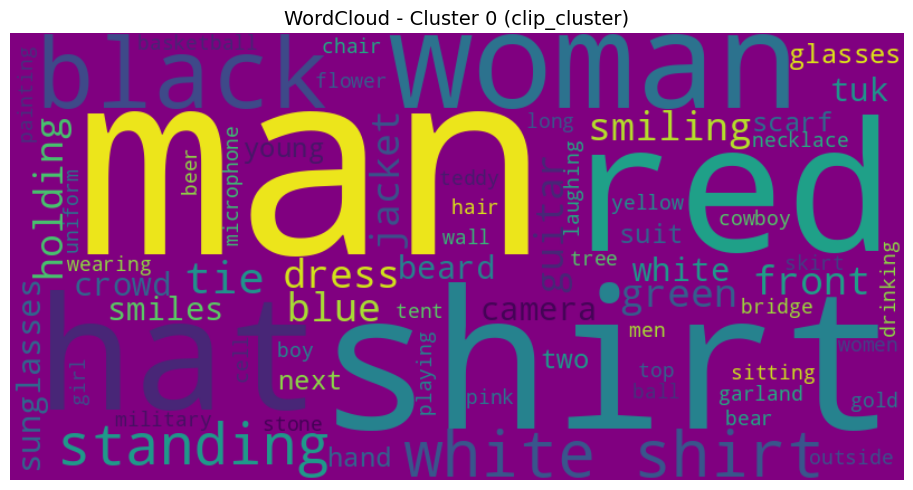

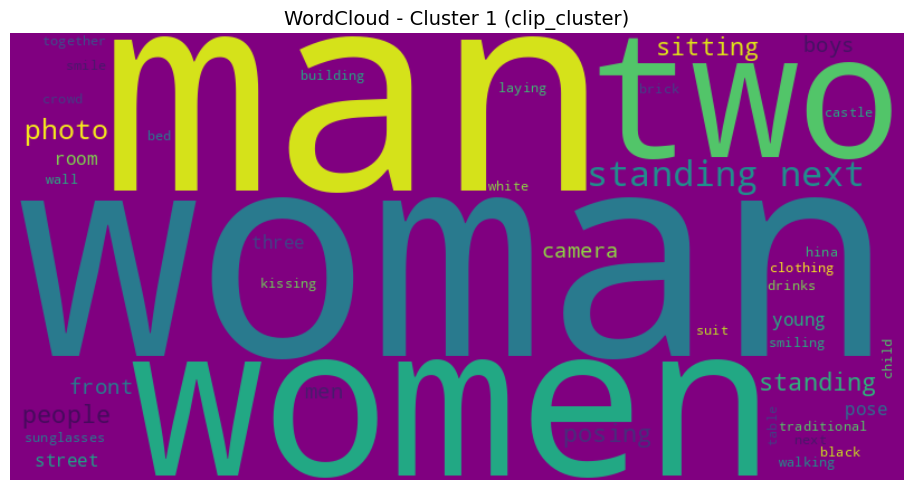

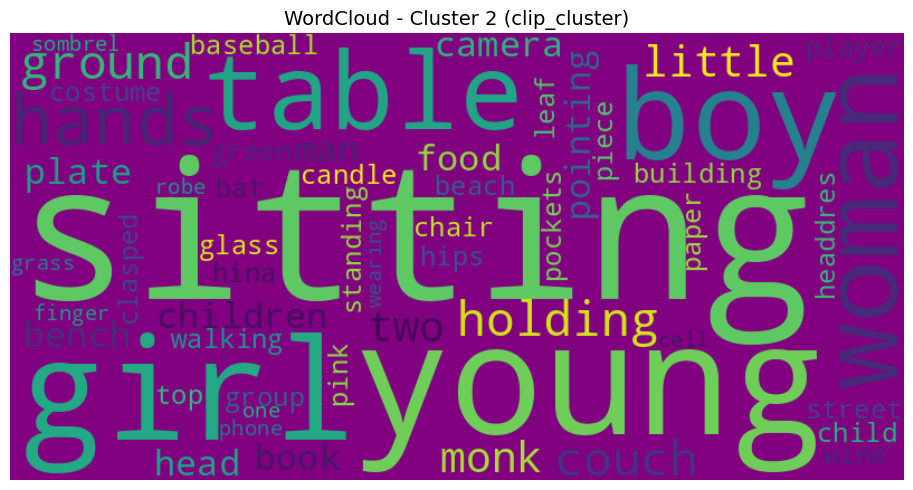

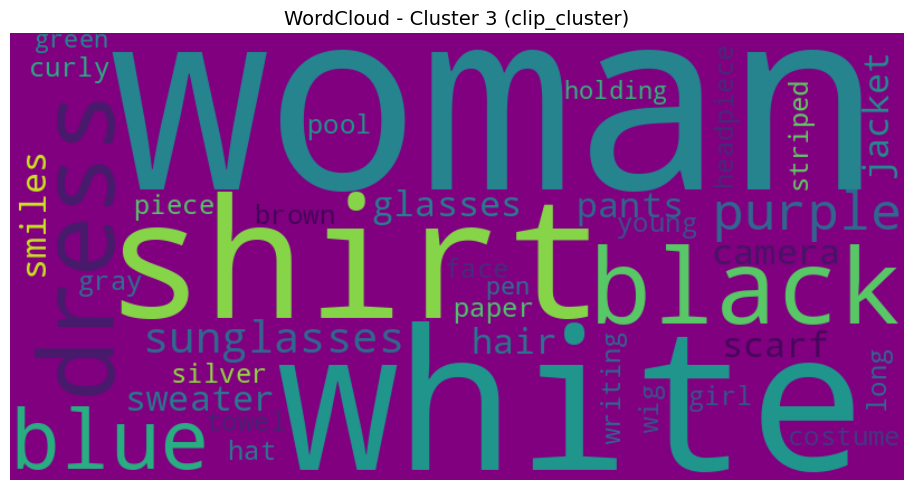

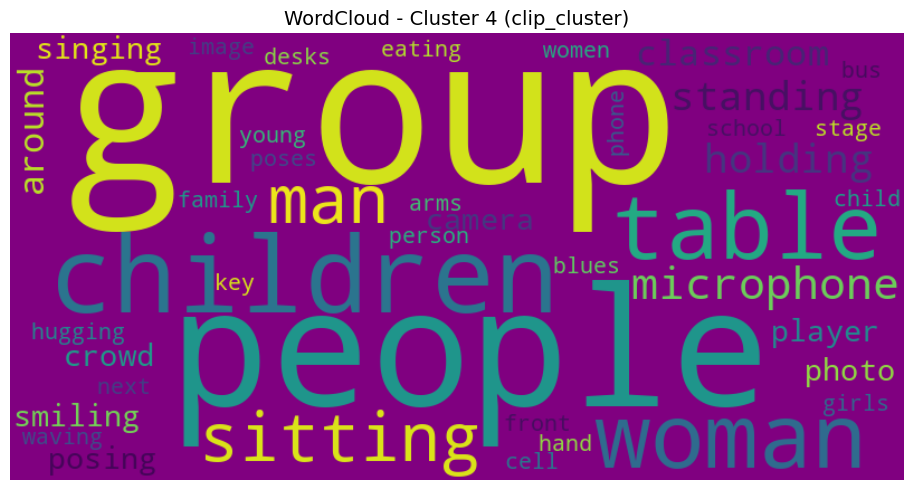

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordclouds_per_cluster(df, cluster_col='semantic_cluster', text_col='caption', max_words=100): #la funzione prende in input il df, il nome della colonna che identifica i cluster, la colonna che contiene i testi e il parametro "max_words" che limita il numero massimo di parole visualizzate in ciascuna WordCloud
    for cluster_id in sorted(df[cluster_col].unique()): #per ogni cluster all'interno della lista ordinata dei cluster unici si estrae tutto il testo delle didascalie associate
        text = ' '.join(df[df[cluster_col] == cluster_id][text_col].dropna())
        if not text.strip(): #se il testo risultante è vuoto o composto solo da spazi, si stampa un messaggio di avviso e si passa al cluster successivo
            print(f"Attenzione: nessun testo per cluster {cluster_id}")
            continue

        wordcloud = WordCloud(width=800, height=400, background_color='purple', max_words=max_words).generate(text) #la classe WordCloud viene istanziata con parametri che definiscono dimensioni dell'immagine, colore di sfondo e numero massimo di parole da visualizzare

        plt.figure(figsize=(10, 5)) #visualizzo il WordCloud tramite matplotlib
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"WordCloud - Cluster {cluster_id} ({cluster_col})", fontsize=14)
        plt.tight_layout()
        plt.show()

plot_wordclouds_per_cluster(balanced_df_subset, cluster_col='clip_cluster')

**CLUSTERIZZAZIONE SEMANTICA CON TF-IDF**

Realizzo una pipeline per analizzare e raggruppare semanticamente le caption. Suddivido i testi in cluster distinti in base al loro contenuto, utilizzando una tecnica classica di rappresentazione del testo (TF-IDF), seguita da un'operazione di riduzione dimensionale (UMAP) e infine da un algoritmo di clustering (KMeans).

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


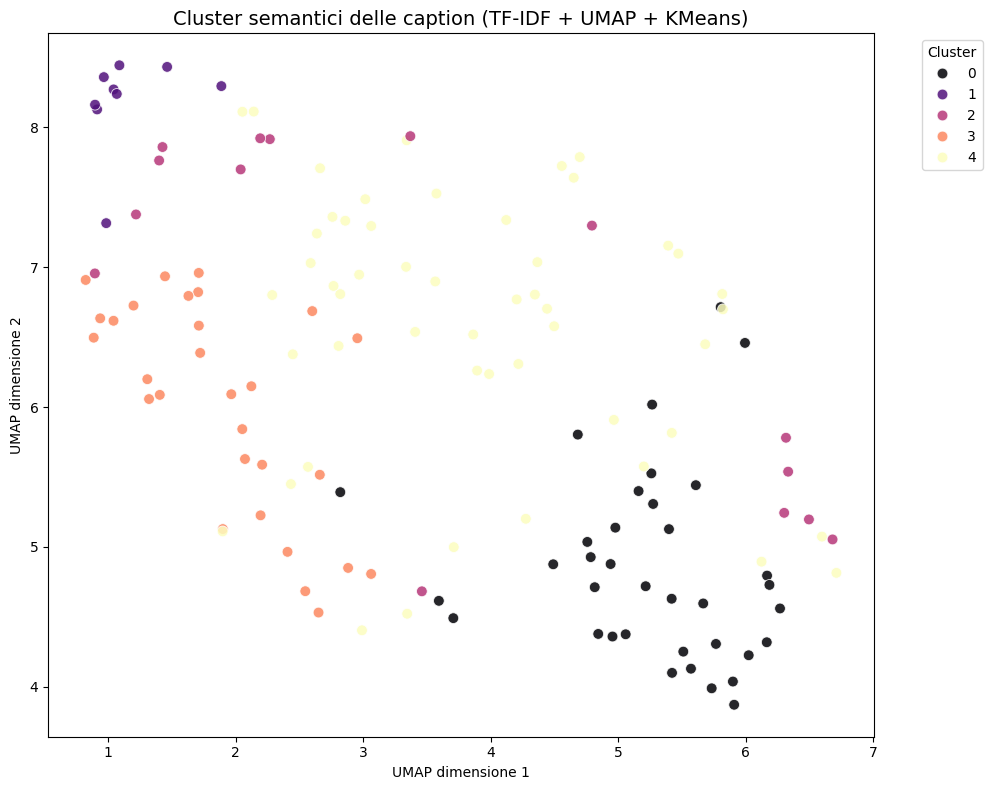

Cluster 0 (TF-IDF):
- a man in a hat and white shirt holding a microphone
- a woman in a white dress and a white scarf
- a woman in blue pants and a white shirt
- a woman in a black shirt and red scarf
- a man in a white shirt and a man in a green shirt
Cluster 1 (TF-IDF):
- two women are standing next to each other women
- two women standing next to each other women
- two women in red shirts and glasses are standing on a bridge
- a group of women sitting at desks in a classroom
- two women sitting at a table with drinks
Cluster 2 (TF-IDF):
- a man and woman posing for a photo
- a man and woman posing for a photo
- two women smiling and posing for the camera
- a group of children are waving and smiling
- a group of children smiling and posing for the camera
Cluster 3 (TF-IDF):
- a group of people sitting in a bus
- a group of children sitting on top of a couch
- children eating at a table
- a young boy sitting on a couch holding a cell phone
- a man and woman are sitting together
Clust

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import umap
import seaborn as sns
import matplotlib.pyplot as plt

captions = balanced_df_subset['caption'].fillna("").astype(str).tolist() #si crea una lista di stringhe chiamata caption estraendo la colonna caption da df ed evenutali valori mancanti sono sostituiti con stringhe vuote tramite ".fillna("")"

try:
    vectorizer = TfidfVectorizer(max_features=1000, stop_words='english') #si istanzia un oggeto TfidVectorizer da scikit-learn, limitando a 1000 ilnumero massimo di feature considerate e filtrando le stopwords
    X_tfidf = vectorizer.fit_transform(captions)
    if X_tfidf.shape[1] == 0: #definisco una matrice sparsa in cui ogni riga rappresenta una didascalia e ogni colonna una parola del vocabolario estratto
        raise ValueError("La matrice TF-IDF è vuota (nessuna feature estratta)")
except Exception as e: #se la matrice risultasse vuota, si laza un errore specifico per intercettare anomalie nel dataset o nella configurazione
    raise RuntimeError(f"Errore nella vettorizzazione TF-IDF: {e}")

try:
    reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42) #configuro UMAP con parametri adatti: 15 vicini, distanza minima 0.1 e metrica coseno per la similarità
    embedding_2d = reducer.fit_transform(X_tfidf.toarray()) #UMAP riceve la matrice TF-IDF convertita in array denso tramite ".toarray()" e produce una nuova matrice "embedding_2d" con solo 2 dimensioni per ogni caption
except Exception as e:
    raise RuntimeError(f"Errore durante la riduzione dimensionale con UMAP: {e}")

try:
    n_clusters_semantic = 5
    if X_tfidf.shape[0] < n_clusters_semantic: #si controlla che il numero di cluster non superi il numero di campioni, altrimenti si alza un errore
        raise ValueError("Numero di cluster maggiore del numero di campioni.")
    kmeans = KMeans(n_clusters=n_clusters_semantic, random_state=42) #si crea e si addestra un modello KMeans, che assegna ad ogni didascalia un'etichetta di cluster basata sulla sua posizione nello spazio TF-IDF
    labels_semantic = kmeans.fit_predict(X_tfidf)
except Exception as e:
    raise RuntimeError(f"Errore nel clustering KMeans: {e}")

try:
    balanced_df_subset['semantic_cluster'] = labels_semantic #le etichette di cluster vengono aggiunte come nuova colonna "semantic_cluster"
    balanced_df_subset['semantic_umap_x'] = embedding_2d[:, 0] #le due dimensioni ridotte ottenute da UMAP vengono aggiunte come colonne "semantic_umap_x" e "semantic_umap_y"
    balanced_df_subset['semantic_umap_y'] = embedding_2d[:, 1]
except Exception as e:
    raise RuntimeError(f"Errore nell'assegnazione dei cluster al DataFrame: {e}")

plt.figure(figsize=(10, 8)) #si usa "seaborn.scatterplot" per disegnare uno scatter plot bidimensionale, usando le coordinate UMAP come assi e colorando i punti in base al cluster di appartenenza
sns.scatterplot(
    x='semantic_umap_x', y='semantic_umap_y', hue='semantic_cluster',
    data=balanced_df_subset, palette='magma', s=60, alpha=0.85
)
plt.title("Cluster semantici delle caption (TF-IDF + UMAP + KMeans)", fontsize=14) #il grafico include titolo, etichette degli assi e legenda posizionata fuori dal grafico per chiarezza
plt.xlabel("UMAP dimensione 1")
plt.ylabel("UMAP dimensione 2")
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

for cluster_id in sorted(balanced_df_subset['semantic_cluster'].unique()):
    print(f"Cluster {cluster_id} (TF-IDF):")
    cluster_data = balanced_df_subset[balanced_df_subset['semantic_cluster'] == cluster_id]
    sample = cluster_data.sample(n=min(5, len(cluster_data)), random_state=42)
    for caption in sample['caption']:
        print(f"- {caption}")

**TOP KEYWORDS PER CLUSTER TF-IDF**

Chiamo la funzione utilizzata per visualizzare le top keywords per il clustering eseguito con CLIP.

In [ ]:
print_top_words_per_cluster(balanced_df_subset, cluster_col='semantic_cluster')

Cluster 0 (semantic_cluster):
 - and: 29
 - shirt: 28
 - white: 20
 - woman: 19
 - man: 18
 - red: 12
 - black: 11
 - with: 7
 - hat: 7
 - dress: 5
Cluster 1 (semantic_cluster):
 - women: 13
 - two: 6
 - standing: 5
 - next: 4
 - each: 4
 - other: 4
 - are: 3
 - sitting: 2
 - three: 2
 - photo: 2
Cluster 2 (semantic_cluster):
 - camera: 10
 - the: 9
 - and: 8
 - posing: 6
 - for: 6
 - woman: 6
 - man: 5
 - smiling: 4
 - smiles: 4
 - two: 3
Cluster 3 (semantic_cluster):
 - sitting: 23
 - table: 10
 - with: 10
 - group: 10
 - young: 7
 - children: 7
 - people: 6
 - woman: 6
 - the: 6
 - boy: 5
Cluster 4 (semantic_cluster):
 - man: 26
 - woman: 23
 - and: 21
 - standing: 15
 - holding: 8
 - next: 7
 - with: 7
 - each: 6
 - other: 6
 - people: 5


**WORDCLOUD PER CLUSTER TF-IDF**

Chiamo la funzione utilizzata per la visualizzazione tramite WordCloud per il clustering con CLIP.

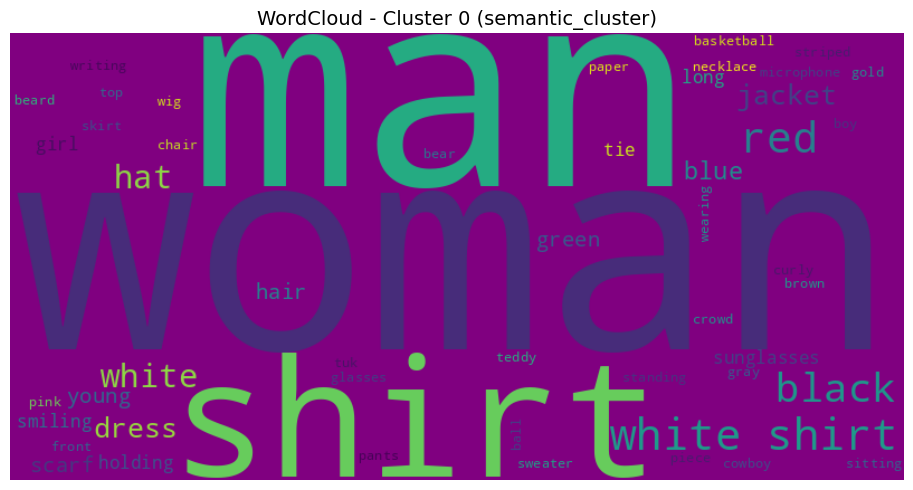

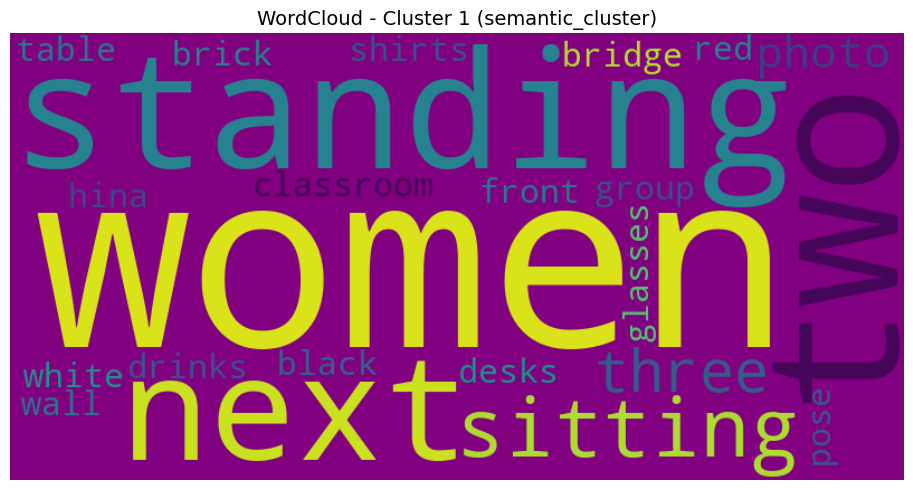

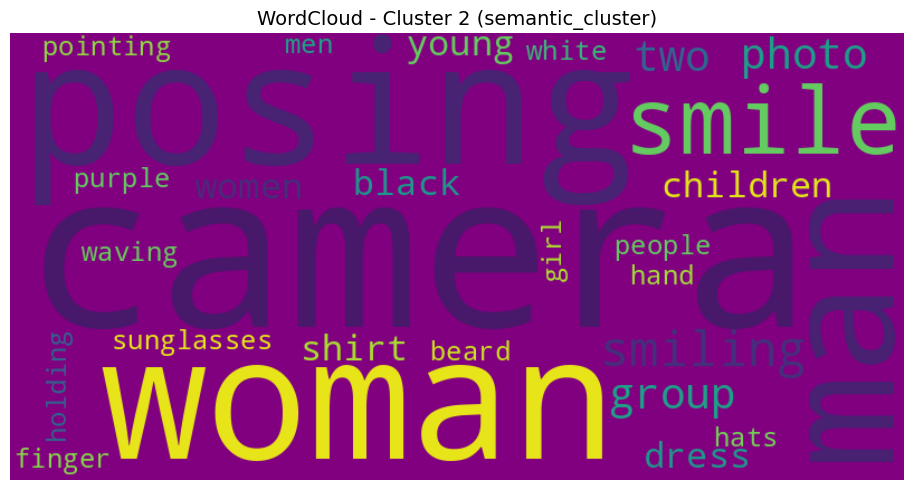

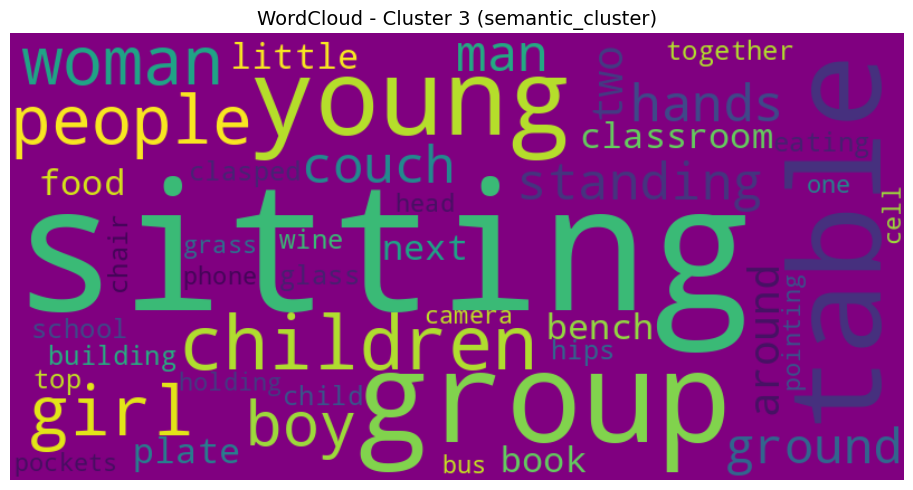

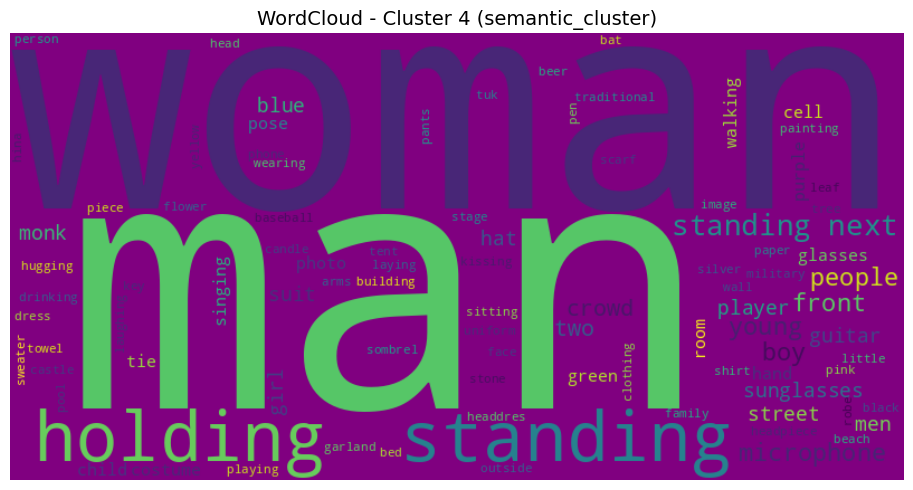

In [ ]:
plot_wordclouds_per_cluster(balanced_df_subset, cluster_col='semantic_cluster')

**SIMILARITA' IMMAGINE-CAPTION CON CLIP**

Calcolo e analizzo la similarità tra immagini e caption utilizzando il modello CLIP di OpenAI, un modello multimodale che mette in relazione immagini e testo. In particolare, calcola per ogni coppia immagine-caption presente del df *balanced:df_subset* un punteggio di similarità, cioè quanto il modello ritiene che il testo descriva bene l'immagine. Visualizza poi la distribuzione di questi punteggi tramite un istogramma.

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Calcolo similarità CLIP: 100%|██████████| 18/18 [00:19<00:00,  1.07s/it]


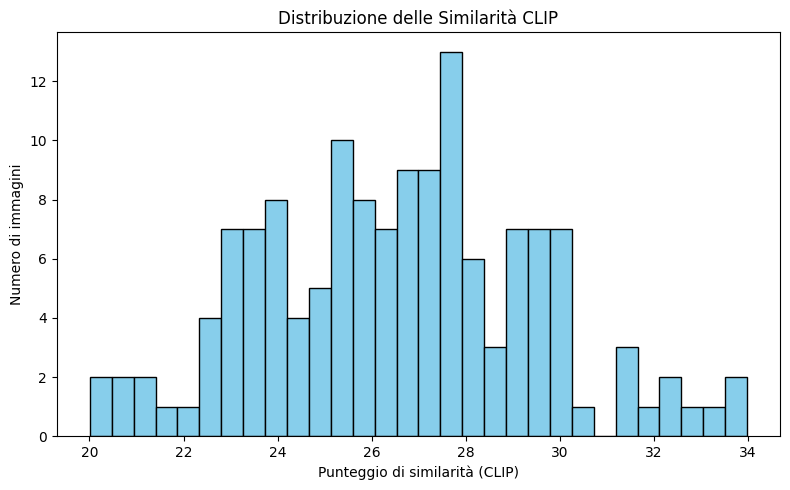

In [ ]:
from transformers import CLIPProcessor, CLIPModel
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32") #scarica e carica il modello CLIP con architettura
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32") #carica il processor, cioè il componente che trasforma immagini e testo in tensori adeguati al modello

device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model = clip_model.to(device).eval()

def compute_clip_similarity_batch(images, captions, processor, model, device): #la funzione prende in input una lista di immagini e di caption, insieme a processor, modello e device
    inputs = processor(text=captions, images=images, return_tensors="pt", padding=True) #usa il processor per convertire testo e immagini in tensori batch, con padding automatico
    inputs = {k: v.to(device) for k, v in inputs.items()} #sposta i tensori sul device scelto
    with torch.no_grad(): #disabilito calcolo gradienti, riuscendo a ottimizzare l'uso della memoria
        outputs = model(**inputs)
    similarities = outputs.logits_per_image.cpu().numpy() #estrae le "logits_per_image", cioè i punteggi di similarità tra ogni immagine e ogni caption del batch, come tensore PyTorch
    return similarities

batch_size = 8

clip_similarities = []

for i in tqdm(range(0, len(balanced_df_subset), batch_size), desc="Calcolo similarità CLIP"):
    batch = balanced_df_subset.iloc[i:i+batch_size] #per ogni batch di righe del df si estraggono le immagini e le caption in liste
    images = list(batch['image'])
    captions = list(batch['caption'])

    try:
        sims = compute_clip_similarity_batch(images, captions, clip_processor, clip_model, device) #si richiama "compute_clip_similarity_batch" per ottenere la matrice delle similarità
        sims_diag = np.diagonal(sims) #si prende la diagonale della matrice sims, cioè i punteggi che associano correttamente l'immagine alla sua didascalia corrispondente
        clip_similarities.extend(sims_diag.tolist())
    except Exception as e:

        clip_similarities.extend([None]*len(batch)) #i punteggi vengono aggiunti alla lista "clip_similarities"; se si verifica un errore si aggiunge None per quel batch

balanced_df_subset['clip_similarity'] = clip_similarities #si crea una nuova colonna nel df originale, contenente i punteggi calcolati

plt.figure(figsize=(8, 5)) #si crea una figura e si disegna un istogramma della distribuzione dei punteggi di similarità
plt.hist(balanced_df_subset['clip_similarity'].dropna(), bins=30, color='skyblue', edgecolor='black')
plt.title("Distribuzione delle Similarità CLIP")
plt.xlabel("Punteggio di similarità (CLIP)")
plt.ylabel("Numero di immagini")
plt.tight_layout()
plt.show()


**VISUALIZZAZIONE VALORI SIMILARITA' IMMAGINE-CAPTION**

Analizzo i risultati di similarità CLIP calcolati precedentemente fornendo:
1. statistiche descrittive;
2. visualizzazione grafica della distribuzione delle similarità, evidenziando la media e le deviazioni standard;
3. alcuni esempi concreti di caption con similarità particolarmente alta e bassa;
4. la media dei punteggi  di similarità per genere, etnia e gruppo demografico (gender+race).



Valori minimi: 20.01
Valori massimi: 33.99
Media: 26.57
Mediana: 26.66
Deviazione standard: 2.92


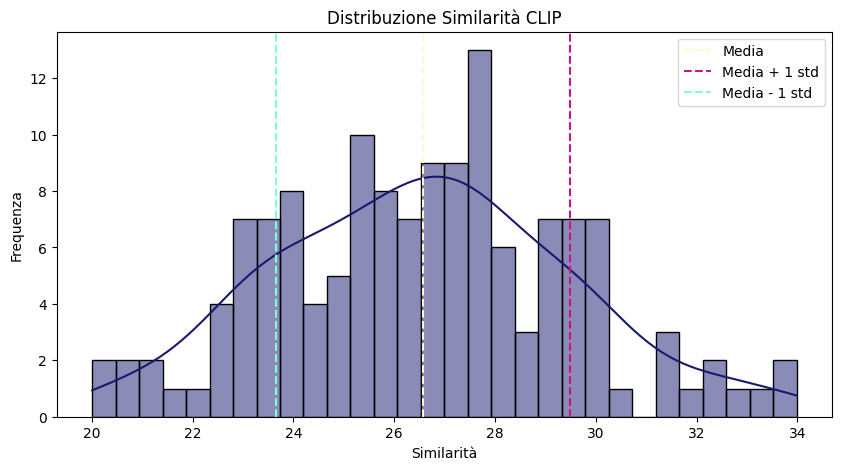

Esempi con similarità ALTA:
33.987 — two women in red shirts and glasses are standing on a bridge
33.818 — a woman in sunglasses is holding a green pen
33.343 — a woman singing into a microphone on stage

Esempi con similarità BASSA:
20.006 — a man and a woman sitting in a room
20.359 — a man and woman walking down the street
20.751 — a man and a little boy sitting at a table

Similarità media per genere: {'Female': 27.005, 'Male': 26.138}
Similarità media per razza: {'Black': 26.634, 'East Asian': 26.319, 'Indian': 26.674, 'Latino_Hispanic': 26.119, 'Middle Eastern': 26.242, 'Southeast Asian': 26.78, 'White': 27.233}
Similarità media per gruppo demografico: {'Female_Black': 27.238, 'Female_East Asian': 27.467, 'Female_Indian': 25.994, 'Female_Latino_Hispanic': 26.157, 'Female_Middle Eastern': 27.161, 'Female_Southeast Asian': 27.364, 'Female_White': 27.656, 'Male_Black': 26.03, 'Male_East Asian': 25.172, 'Male_Indian': 27.353, 'Male_Latino_Hispanic': 26.082, 'Male_Middle Eastern': 25.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

similarities = balanced_df_subset['clip_similarity'].dropna() #estraggo la colonna delle similarità dal df, eliminando i valori nulli o mancanti

print(f"Valori minimi: {similarities.min():.2f}") #calcolo e stampo le statistiche descrittive
print(f"Valori massimi: {similarities.max():.2f}")
print(f"Media: {similarities.mean():.2f}")
print(f"Mediana: {similarities.median():.2f}")
print(f"Deviazione standard: {similarities.std():.2f}")

mean_val = similarities.mean()
std_val = similarities.std()

plt.figure(figsize=(10,5)) #creo un istogramma delle similarità, con 30 bin e con la funzione di densità di kernel (KDE), che approssima la forma continua della distribuzione
sns.histplot(similarities, bins=30, kde=True, color='midnightblue')
plt.axvline(mean_val, color='lemonchiffon', linestyle='--', label='Media') #si aggiungono linee verticali tratteggiate per la media, la media più una deviazione standard e la media meno una deviazione standard
plt.axvline(mean_val + std_val, color='mediumvioletred', linestyle='--', label='Media + 1 std')
plt.axvline(mean_val - std_val, color='aquamarine', linestyle='--', label='Media - 1 std')
plt.title("Distribuzione Similarità CLIP")
plt.xlabel("Similarità")
plt.ylabel("Frequenza")
plt.legend()
plt.show()

print("Esempi con similarità ALTA:")
for idx, row in balanced_df_subset.nlargest(3, 'clip_similarity')[['caption', 'clip_similarity']].iterrows(): #seleziono le 3 didascalie con la similarità più alta e le stampo con punteggio e testo
    print(f"{row['clip_similarity']:.3f} — {row['caption']}")

print("\nEsempi con similarità BASSA:")
for idx, row in balanced_df_subset.nsmallest(3, 'clip_similarity')[['caption', 'clip_similarity']].iterrows(): #seleziono le 3 didascalie con similarità più bassa e le stampo con punteggio e testo
    print(f"{row['clip_similarity']:.3f} — {row['caption']}")

gender_bias = balanced_df_subset.groupby('gender')['clip_similarity'].mean().round(3).to_dict() #calcolo la media dei punteggi di similarità raggruppando i dati per "gender", "race", "group", arrotondando i valori a 3 decimali e trasformandoli in dizionari
race_bias = balanced_df_subset.groupby('race')['clip_similarity'].mean().round(3).to_dict()
group_bias = balanced_df_subset.groupby('group')['clip_similarity'].mean().round(3).to_dict()

print("\nSimilarità media per genere:", gender_bias)
print("Similarità media per razza:", race_bias)
print("Similarità media per gruppo demografico:", group_bias)